In [79]:
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import numpy as np
import os
from glob import glob
from tensorflow.keras.preprocessing.image import load_img, img_to_array


In [80]:
# ================================
# 4.1 Imports and Base Paths
# ================================
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from glob import glob
from collections import Counter
from PIL import Image

# For directory-based label handling (same style as your notebooks)
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Base directory for Sovit Rath's DR dataset
BASE_DIR = "/kaggle/input/diabetic-retinopathy-224x224-2019-data"
IMG_DIR  = os.path.join(BASE_DIR, "colored_images")

print("Base path:", BASE_DIR)
print("Image path:", IMG_DIR)
print("Available class folders:", os.listdir(IMG_DIR))

Base path: /kaggle/input/diabetic-retinopathy-224x224-2019-data
Image path: /kaggle/input/diabetic-retinopathy-224x224-2019-data/colored_images
Available class folders: ['Mild', 'Proliferate_DR', 'Moderate', 'No_DR', 'Severe']


In [81]:
# ================================
# 4.2 Basic Structure and Counts
# ================================
class_dirs = sorted([d for d in os.listdir(IMG_DIR) if os.path.isdir(os.path.join(IMG_DIR, d))])
print("Detected classes:", class_dirs)

image_records = []

for cls in class_dirs:
    cls_path = os.path.join(IMG_DIR, cls)
    pngs = glob(os.path.join(cls_path, "*.png"))
    jpgs = glob(os.path.join(cls_path, "*.jpg"))
    files = pngs + jpgs
    
    for f in files:
        image_records.append((os.path.basename(f), cls, f))

df_images = pd.DataFrame(image_records, columns=["filename", "label", "filepath"])

print("Total images:", len(df_images))
df_images.head()

Detected classes: ['Mild', 'Moderate', 'No_DR', 'Proliferate_DR', 'Severe']
Total images: 3662


,filename,label,filepath
0,f481f76a6b75.png,Mild,/kaggle/input/diabetic-retinopathy-224x224-201...
1,abdb365cacbc.png,Mild,/kaggle/input/diabetic-retinopathy-224x224-201...
2,33ffddea8c6e.png,Mild,/kaggle/input/diabetic-retinopathy-224x224-201...
3,059bc89df7f4.png,Mild,/kaggle/input/diabetic-retinopathy-224x224-201...
4,278aa860dffd.png,Mild,/kaggle/input/diabetic-retinopathy-224x224-201...


In [82]:
# ================================
# 4.4 Mapping Folder Names to DR Grades
# (Optional: use this mapping later in models)
# ================================
# Adjust mapping if your folder names differ
label_mapping = {
    "No_DR": 0,
    "Mild": 1,
    "Moderate": 2,
    "Severe": 3,
    "Proliferate_DR": 4
}

df_images["grade"] = df_images["label"].map(label_mapping)
df_images.head()

,filename,label,filepath,grade
0,f481f76a6b75.png,Mild,/kaggle/input/diabetic-retinopathy-224x224-201...,1
1,abdb365cacbc.png,Mild,/kaggle/input/diabetic-retinopathy-224x224-201...,1
2,33ffddea8c6e.png,Mild,/kaggle/input/diabetic-retinopathy-224x224-201...,1
3,059bc89df7f4.png,Mild,/kaggle/input/diabetic-retinopathy-224x224-201...,1
4,278aa860dffd.png,Mild,/kaggle/input/diabetic-retinopathy-224x224-201...,1


In [83]:
# ================================
# 4.5 Check Image Shapes and Verify 224×224
# (Random subset to avoid heavy IO if needed)
# ================================
sample_paths = df_images["filepath"].sample(min(500, len(df_images)), random_state=42).tolist()

shapes = []
for p in sample_paths:
    with Image.open(p) as img:
        shapes.append(img.size)  # (width, height)

shapes_arr = np.array(shapes)
print("Unique shapes found (width, height):", np.unique(shapes_arr, axis=0))
print("Mean width, height:", shapes_arr.mean(axis=0))

Unique shapes found (width, height): [[224 224]]
Mean width, height: [224. 224.]


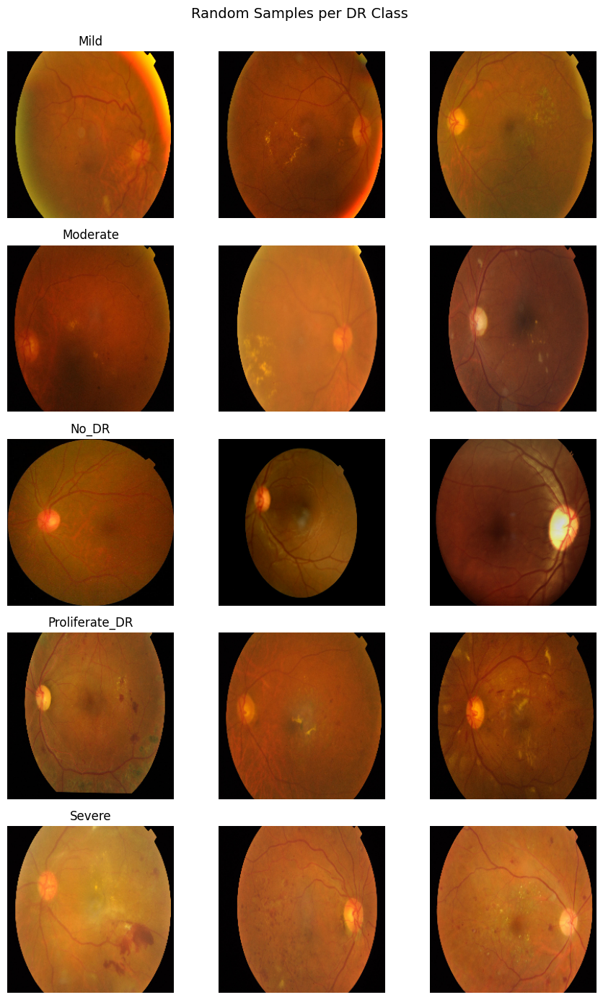

In [84]:
# ================================
# 4.6 Visual Inspection of Sample Images per Class
# ================================
n_classes_to_show = len(class_dirs)
n_per_class = 3  # change to 5 if you want more examples

plt.figure(figsize=(3 * n_per_class, 3 * n_classes_to_show))

for row, cls in enumerate(class_dirs):
    cls_df = df_images[df_images["label"] == cls].sample(min(n_per_class, len(df_images)), random_state=row)
    for col, (_, row_data) in enumerate(cls_df.iterrows()):
        img = Image.open(row_data["filepath"])
        ax = plt.subplot(n_classes_to_show, n_per_class, row * n_per_class + col + 1)
        plt.imshow(img)
        plt.axis("off")
        ax.set_title(cls if col == 0 else "")

plt.suptitle("Random Samples per DR Class \n \n \n \n \n", y=0.92, fontsize=14)
plt.tight_layout()
plt.show()

In [85]:
# ================================
# 4.7 Brightness / Intensity Statistics Per Class
# (Helps understand exposure differences between classes)
# ================================
def compute_brightness(path, resize_to=(64, 64)):
    with Image.open(path) as img:
        img = img.convert("L")  # grayscale
        if resize_to is not None:
            img = img.resize(resize_to)
        arr = np.array(img) / 255.0
        return arr.mean()

brightness_records = []

for cls in class_dirs:
    # sample a fixed number per class to keep it light
    cls_files = df_images[df_images["label"] == cls]["filepath"].sample(
        min(200, df_images[df_images["label"] == cls].shape[0]),
        random_state=42
    )
    for f in cls_files:
        brightness_records.append((cls, compute_brightness(f)))

df_brightness = pd.DataFrame(brightness_records, columns=["label", "brightness"])

print(df_brightness.groupby("label")["brightness"].describe())

                count      mean       std       min       25%       50%  \
label                                                                     
Mild            200.0  0.273320  0.059354  0.137258  0.231391  0.269741   
Moderate        200.0  0.271654  0.060142  0.131772  0.227449  0.270850   
No_DR           200.0  0.255317  0.081027  0.076954  0.181954  0.278436   
Proliferate_DR  200.0  0.258668  0.057946  0.106848  0.226588  0.260434   
Severe          193.0  0.256653  0.067448  0.131222  0.202565  0.251781   

                     75%       max  
label                               
Mild            0.312044  0.471215  
Moderate        0.314462  0.421024  
No_DR           0.326432  0.405252  
Proliferate_DR  0.292738  0.406501  
Severe          0.308454  0.460043  


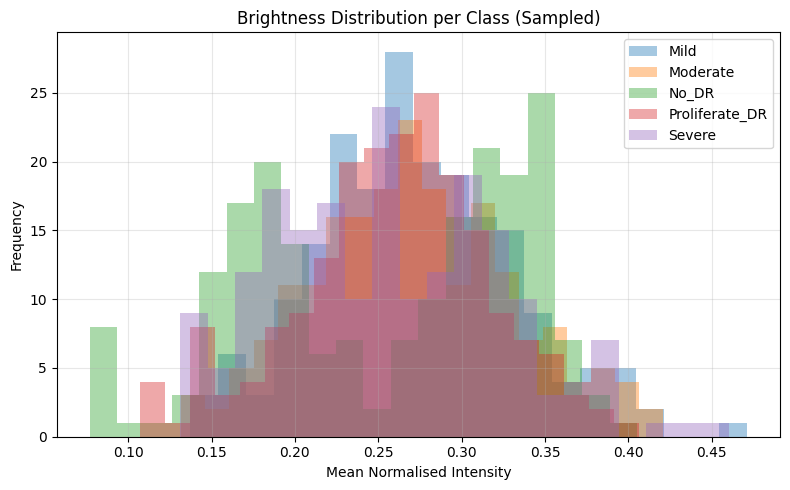

In [86]:
# ================================
# 4.8 Plot Brightness Distribution Per Class
# ================================
plt.figure(figsize=(8, 5))

for cls in class_dirs:
    subset = df_brightness[df_brightness["label"] == cls]["brightness"]
    plt.hist(subset, bins=20, alpha=0.4, label=cls)

plt.title("Brightness Distribution per Class (Sampled)")
plt.xlabel("Mean Normalised Intensity")
plt.ylabel("Frequency")
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [87]:
# ================================
# 4.9 Directory-Based EDA via ImageDataGenerator
# (Aligned with your Keras pipelines)
# ================================
datagen = ImageDataGenerator(rescale=1./255)

eda_gen = datagen.flow_from_directory(
    directory=IMG_DIR,
    target_size=(224, 224),
    batch_size=32,
    class_mode="categorical",
    shuffle=False
)

print("Found images:", eda_gen.n)
print("Class indices mapping:", eda_gen.class_indices)

Found 3662 images belonging to 5 classes.
Found images: 3662
Class indices mapping: {'Mild': 0, 'Moderate': 1, 'No_DR': 2, 'Proliferate_DR': 3, 'Severe': 4}


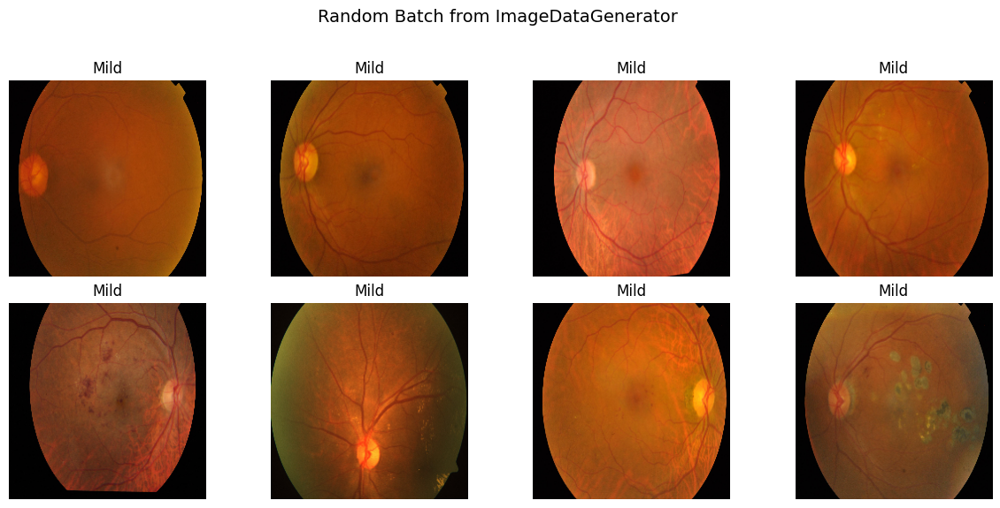

In [88]:
# ================================
# 4.10 Quick Batch Visualisation (As Seen by the Model)
# ================================
batch_x, batch_y = next(eda_gen)

plt.figure(figsize=(12, 6))
for i in range(8):
    ax = plt.subplot(2, 4, i + 1)
    plt.imshow(batch_x[i])
    label_idx = np.argmax(batch_y[i])
    # reverse mapping from index to label
    idx_to_class = {v: k for k, v in eda_gen.class_indices.items()}
    ax.set_title(idx_to_class[label_idx])
    plt.axis("off")

plt.suptitle("Random Batch from ImageDataGenerator \n \n", y=0.95, fontsize=14)
plt.tight_layout()
plt.show()

Base path: /kaggle/input/diabetic-retinopathy-224x224-2019-data
Image path: /kaggle/input/diabetic-retinopathy-224x224-2019-data/colored_images
Detected class folders: ['Mild', 'Moderate', 'No_DR', 'Proliferate_DR', 'Severe']

Image count per class:
  Mild (Mild): 370 images
  Moderate (Moderate): 999 images
  No_DR (No_DR): 1805 images
  Proliferate_DR (Proliferate_DR): 295 images
  Severe (Severe): 193 images


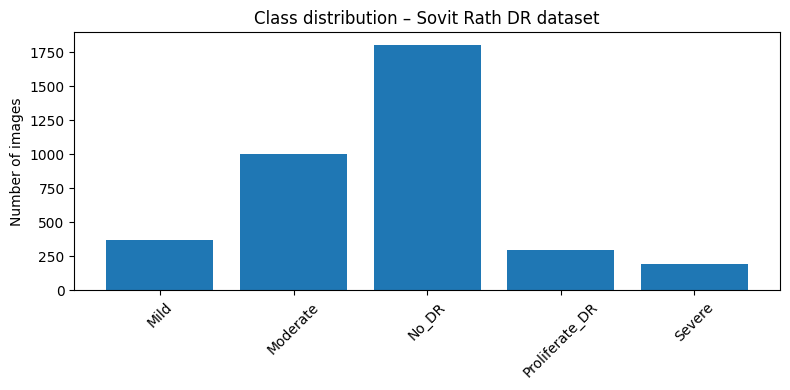

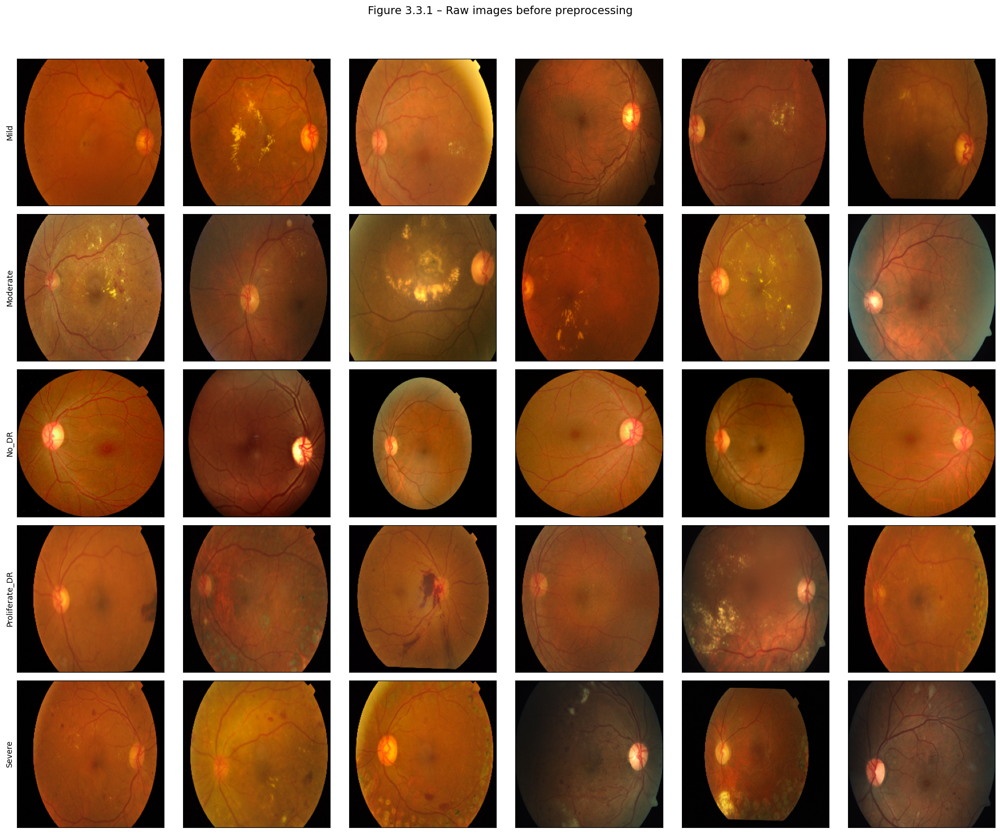

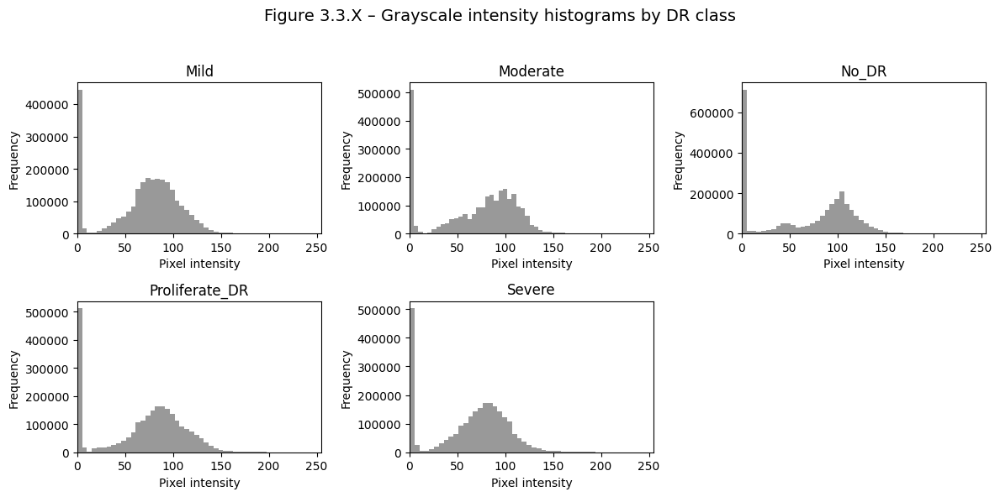

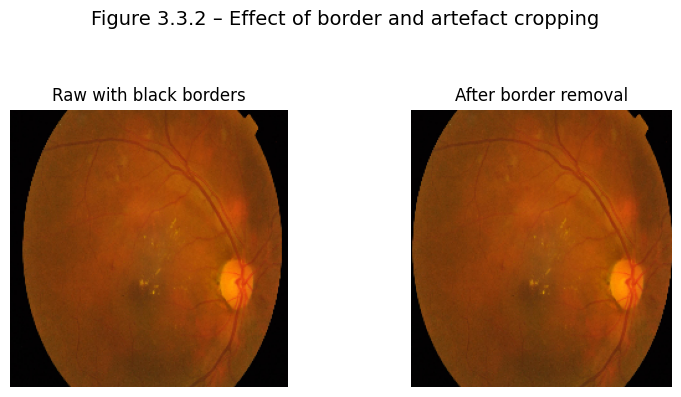

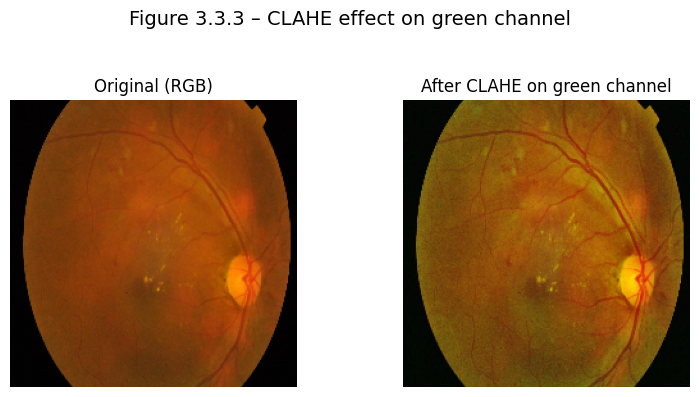

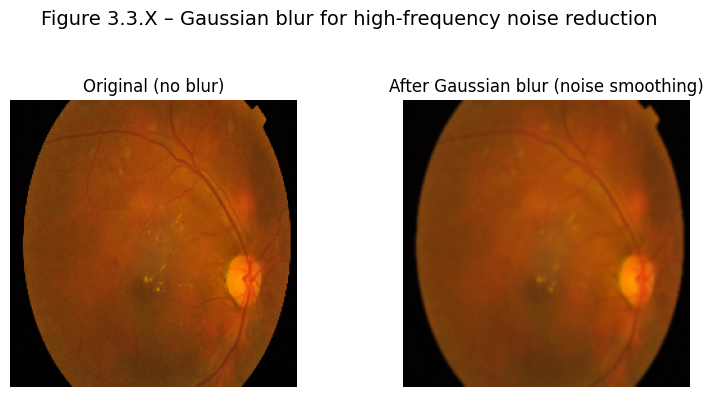

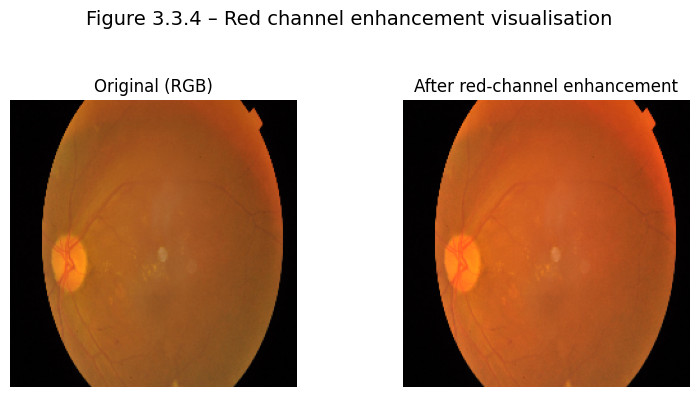

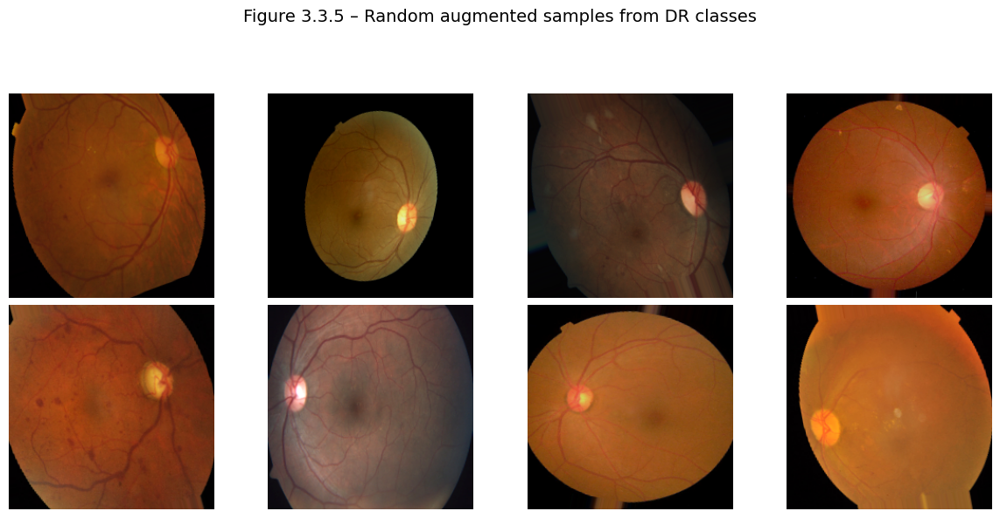

✅ EDA completed: class distribution, raw samples, histograms, CLAHE, border removal, blur, red enhancement, augmentation preview.


In [89]:
# ================================================
# 3.X Exploratory Data Analysis (EDA) – Full Block
# ================================================
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import cv2

from glob import glob
from collections import Counter
from PIL import Image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# -----------------------------
# Base paths (adjust if needed)
# -----------------------------
BASE_DIR = "/kaggle/input/diabetic-retinopathy-224x224-2019-data"
IMG_DIR  = os.path.join(BASE_DIR, "colored_images")

print("Base path:", BASE_DIR)
print("Image path:", IMG_DIR)

class_dirs = sorted([
    d for d in os.listdir(IMG_DIR)
    if os.path.isdir(os.path.join(IMG_DIR, d))
])
print("Detected class folders:", class_dirs)

# Optional: mapping for nicer labels (if you want thesis-style names)
DR_CLASS_NAMES = {
    "0": "No_DR",
    "1": "Mild_DR",
    "2": "Moderate_DR",
    "3": "Severe_DR",
    "4": "Proliferate_DR",
}
def pretty_class_name(folder_name):
    # if folder is "0","1"... use mapping; else use folder name itself
    return DR_CLASS_NAMES.get(folder_name, folder_name)


# =======================================
# Helper functions
# =======================================
def load_img_rgb(path):
    """Load image as RGB (H,W,3) uint8."""
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def crop_black_border(img, tol=5):
    """
    Remove black borders based on grayscale threshold.
    tol: intensity threshold (0–255).
    """
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    mask = gray > tol

    if not np.any(mask):
        return img  # fallback if mask empty

    coords = np.argwhere(mask)
    y0, x0 = coords.min(axis=0)
    y1, x1 = coords.max(axis=0) + 1  # slices are exclusive at the top
    cropped = img[y0:y1, x0:x1]
    return cropped

def apply_clahe_green(img, clip_limit=2.0, tile_grid_size=(8,8)):
    """Apply CLAHE to green channel and return enhanced RGB."""
    # img is RGB uint8
    bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    b, g, r = cv2.split(bgr)
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    g_clahe = clahe.apply(g)
    bgr_enh = cv2.merge([b, g_clahe, r])
    rgb_enh = cv2.cvtColor(bgr_enh, cv2.COLOR_BGR2RGB)
    return rgb_enh

def apply_gaussian_blur(img, ksize=(5,5)):
    """Simple Gaussian blur (for noise reduction demo)."""
    bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    blur = cv2.GaussianBlur(bgr, ksize, 0)
    rgb_blur = cv2.cvtColor(blur, cv2.COLOR_BGR2RGB)
    return rgb_blur

def enhance_red_channel(img, factor=1.2):
    """
    Slightly boost red channel to highlight haemorrhagic / neovascular lesions.
    factor > 1.0 will brighten red channel.
    """
    img = img.astype(np.float32)
    r = img[..., 0] * factor
    r = np.clip(r, 0, 255)
    img_enh = img.copy()
    img_enh[..., 0] = r
    return img_enh.astype(np.uint8)


# =======================================
# 1. Class distribution and image counts
# =======================================
class_to_paths = {}

for cls in class_dirs:
    pattern_png = glob(os.path.join(IMG_DIR, cls, "*.png"))
    pattern_jpg = glob(os.path.join(IMG_DIR, cls, "*.jpg"))
    paths = pattern_png + pattern_jpg
    class_to_paths[cls] = paths

# Print counts
print("\nImage count per class:")
for cls in class_dirs:
    print(f"  {cls} ({pretty_class_name(cls)}): {len(class_to_paths[cls])} images")

# Bar plot of class distribution
plt.figure(figsize=(8,4))
counts = [len(class_to_paths[cls]) for cls in class_dirs]
plt.bar(range(len(class_dirs)), counts, tick_label=[pretty_class_name(c) for c in class_dirs])
plt.xticks(rotation=45)
plt.ylabel("Number of images")
plt.title("Class distribution – Sovit Rath DR dataset")
plt.tight_layout()
plt.show()


# =======================================
# 2. Raw sample visualisation per class
# =======================================
n_per_class = 6  # number of images per class to show

plt.figure(figsize=(3 * n_per_class, 3 * len(class_dirs)))
for row, cls in enumerate(class_dirs):
    paths = class_to_paths[cls]
    if len(paths) == 0:
        continue
    sample_paths = random.sample(paths, min(n_per_class, len(paths)))
    for col, p in enumerate(sample_paths):
        img = load_img_rgb(p)
        ax = plt.subplot(len(class_dirs), n_per_class, row * n_per_class + col + 1)
        ax.imshow(img)
        if col == 0:
            ax.set_ylabel(pretty_class_name(cls), fontsize=10)
        ax.set_xticks([])
        ax.set_yticks([])

plt.suptitle("Figure 3.3.1 – Raw images before preprocessing", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


# =======================================
# 3. Grayscale intensity histograms per class
# =======================================
plt.figure(figsize=(12, 6))

for i, cls in enumerate(class_dirs, start=1):
    paths = class_to_paths[cls]
    if len(paths) == 0:
        continue

    n_hist = min(50, len(paths))
    sample_paths = random.sample(paths, n_hist)
    intensities = []

    for p in sample_paths:
        img = load_img_rgb(p)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        intensities.append(gray.flatten())

    intensities = np.concatenate(intensities, axis=0)

    ax = plt.subplot(2, (len(class_dirs)+1)//2, i)
    ax.hist(intensities, bins=50, color='gray', alpha=0.8)
    ax.set_title(pretty_class_name(cls))
    ax.set_xlim(0, 255)
    ax.set_xlabel("Pixel intensity")
    ax.set_ylabel("Frequency")

plt.suptitle("Figure 3.3.X – Grayscale intensity histograms by DR class", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


# =======================================
# 4. Border removal demonstration
# =======================================
# Pick one example image that visibly has borders (take any class with images)
demo_cls = class_dirs[0]
demo_path = class_to_paths[demo_cls][0]

raw_demo = load_img_rgb(demo_path)
cropped_demo = crop_black_border(raw_demo)

plt.figure(figsize=(8,4))
ax1 = plt.subplot(1,2,1)
ax1.imshow(raw_demo)
ax1.set_title("Raw with black borders")
ax1.axis("off")

ax2 = plt.subplot(1,2,2)
ax2.imshow(cropped_demo)
ax2.set_title("After border removal")
ax2.axis("off")

plt.suptitle("Figure 3.3.2 – Effect of border and artefact cropping", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()


# =======================================
# 5. CLAHE on green channel demonstration
# =======================================
# Choose a Mild or Moderate class if available, else reuse demo
clahe_cls = None
for candidate in ["1", "Mild", "Mild_DR", "Moderate", "2"]:
    if candidate in class_to_paths and len(class_to_paths[candidate]) > 0:
        clahe_cls = candidate
        break
if clahe_cls is None:
    clahe_cls = demo_cls

clahe_path = class_to_paths[clahe_cls][0]
clahe_raw = load_img_rgb(clahe_path)
clahe_enh = apply_clahe_green(clahe_raw)

plt.figure(figsize=(8,4))
ax1 = plt.subplot(1,2,1)
ax1.imshow(clahe_raw)
ax1.set_title("Original (RGB)")
ax1.axis("off")

ax2 = plt.subplot(1,2,2)
ax2.imshow(clahe_enh)
ax2.set_title("After CLAHE on green channel")
ax2.axis("off")

plt.suptitle("Figure 3.3.3 – CLAHE effect on green channel", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()


# =======================================
# 6. Gaussian blur demonstration (noise reduction)
# =======================================
blur_demo = load_img_rgb(demo_path)
blurred = apply_gaussian_blur(blur_demo, ksize=(5,5))

plt.figure(figsize=(8,4))
ax1 = plt.subplot(1,2,1)
ax1.imshow(blur_demo)
ax1.set_title("Original (no blur)")
ax1.axis("off")

ax2 = plt.subplot(1,2,2)
ax2.imshow(blurred)
ax2.set_title("After Gaussian blur (noise smoothing)")
ax2.axis("off")

plt.suptitle("Figure 3.3.X – Gaussian blur for high-frequency noise reduction", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()


# =======================================
# 7. Red channel enhancement demonstration
# =======================================
red_demo_cls = None
for candidate in ["2", "3", "4", "Moderate", "Severe", "Proliferate_DR"]:
    if candidate in class_to_paths and len(class_to_paths[candidate]) > 0:
        red_demo_cls = candidate
        break
if red_demo_cls is None:
    red_demo_cls = demo_cls

red_path = class_to_paths[red_demo_cls][0]
red_raw = load_img_rgb(red_path)
red_enh = enhance_red_channel(red_raw, factor=1.2)

plt.figure(figsize=(8,4))
ax1 = plt.subplot(1,2,1)
ax1.imshow(red_raw)
ax1.set_title("Original (RGB)")
ax1.axis("off")

ax2 = plt.subplot(1,2,2)
ax2.imshow(red_enh)
ax2.set_title("After red-channel enhancement")
ax2.axis("off")

plt.suptitle("Figure 3.3.4 – Red channel enhancement visualisation", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()


# =======================================
# 8. Data augmentation preview
# =======================================
# Build a small numpy batch from multiple classes
aug_paths = []
for cls in class_dirs:
    aug_paths.extend(class_to_paths[cls][:3])  # up to 3 per class

aug_images = []
for p in aug_paths:
    img = load_img_rgb(p)
    img = cv2.resize(img, (224, 224))
    aug_images.append(img)
aug_images = np.array(aug_images, dtype=np.float32)

# Simple ImageDataGenerator setup (same style as training)
datagen = ImageDataGenerator(
    rotation_range=20,
    horizontal_flip=True,
    zoom_range=0.1,
    brightness_range=[0.8, 1.2],
    fill_mode='nearest'
)

batch_iter = datagen.flow(aug_images, batch_size=8, shuffle=True)

aug_batch = next(batch_iter) / 255.0  # scale to [0,1] for display

plt.figure(figsize=(12,6))
for i in range(min(8, len(aug_batch))):
    ax = plt.subplot(2,4,i+1)
    ax.imshow(aug_batch[i])
    ax.axis("off")

plt.suptitle("Figure 3.3.5 – Random augmented samples from DR classes", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.90])
plt.show()

print("✅ EDA completed: class distribution, raw samples, histograms, CLAHE, border removal, blur, red enhancement, augmentation preview.")

In [90]:
# Path to your image folder
data_dir = "/kaggle/input/diabetic-retinopathy-224x224-2019-data/colored_images/Severe"

# Load all images and resize to 64x64 for DCGAN
image_paths = glob(os.path.join(data_dir, "*.png")) + glob(os.path.join(data_dir, "*.jpg"))

def load_and_preprocess_image(path):
    img = load_img(path, target_size=(64, 64))
    img = img_to_array(img)
    img = (img - 127.5) / 127.5  # Normalize to [-1, 1]
    return img

images = np.array([load_and_preprocess_image(path) for path in image_paths])
print("Dataset shape:", images.shape)

# Create TensorFlow dataset
BUFFER_SIZE = len(images)
BATCH_SIZE = 32

dataset = tf.data.Dataset.from_tensor_slices(images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)


Dataset shape: (193, 64, 64, 3)


In [91]:
def make_generator_model():
    model = tf.keras.Sequential([
        layers.Dense(8*8*256, use_bias=False, input_shape=(100,)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),
        layers.Reshape((8, 8, 256)),

        layers.Conv2DTranspose(128, (5,5), strides=(2,2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(64, (5,5), strides=(2,2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(3, (5,5), strides=(2,2), padding='same', use_bias=False, activation='tanh')
    ])
    return model

generator = make_generator_model()
generator.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_11 (Dense)                │ (None, 16384)          │     1,638,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_103         │ (None, 16384)          │        65,536 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_1 (Reshape)             │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 16, 16, 128)    │       819,200 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_104         │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_4              │ (None, 32, 32, 64)     │       204,800 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_105         │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_5              │ (None, 64, 64, 3)      │         4,800 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,733,504 (10.43 MB)

 Trainable params: 2,700,352 (10.30 MB)

 Non-trainable params: 33,152 (129.50 KB)

In [92]:
def make_discriminator_model():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5,5), strides=(2,2), padding='same', input_shape=[64, 64, 3]),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, (5,5), strides=(2,2), padding='same'),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1)
    ])
    return model

discriminator = make_discriminator_model()
discriminator.summary()


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_96 (Conv2D)              │ (None, 32, 32, 64)     │         4,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_8 (LeakyReLU)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_97 (Conv2D)              │ (None, 16, 16, 128)    │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_9 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 1)              │        32,769 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 242,561 (947.50 KB)

 Trainable params: 242,561 (947.50 KB)

 Non-trainable params: 0 (0.00 B)

In [93]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)


In [94]:
EPOCHS = 5000
noise_dim = 100
num_examples_to_generate = 16
seed = tf.random.normal([num_examples_to_generate, noise_dim])

@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

def train(dataset, epochs):
    for epoch in range(epochs):
        for image_batch in dataset:
            train_step(image_batch)
        print(f"✅ Epoch {epoch+1}/{epochs} completed")


In [95]:
train(dataset, EPOCHS)
print("🎉 Training completed!")


E0000 00:00:1765477840.070590      47 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_3_1/dropout_9_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


✅ Epoch 1/5000 completed
✅ Epoch 2/5000 completed
✅ Epoch 3/5000 completed
✅ Epoch 4/5000 completed
✅ Epoch 5/5000 completed
✅ Epoch 6/5000 completed
✅ Epoch 7/5000 completed
✅ Epoch 8/5000 completed
✅ Epoch 9/5000 completed
✅ Epoch 10/5000 completed
✅ Epoch 11/5000 completed
✅ Epoch 12/5000 completed
✅ Epoch 13/5000 completed
✅ Epoch 14/5000 completed
✅ Epoch 15/5000 completed
✅ Epoch 16/5000 completed
✅ Epoch 17/5000 completed
✅ Epoch 18/5000 completed
✅ Epoch 19/5000 completed
✅ Epoch 20/5000 completed
✅ Epoch 21/5000 completed
✅ Epoch 22/5000 completed
✅ Epoch 23/5000 completed
✅ Epoch 24/5000 completed
✅ Epoch 25/5000 completed
✅ Epoch 26/5000 completed
✅ Epoch 27/5000 completed
✅ Epoch 28/5000 completed
✅ Epoch 29/5000 completed
✅ Epoch 30/5000 completed
✅ Epoch 31/5000 completed
✅ Epoch 32/5000 completed
✅ Epoch 33/5000 completed
✅ Epoch 34/5000 completed
✅ Epoch 35/5000 completed
✅ Epoch 36/5000 completed
✅ Epoch 37/5000 completed
✅ Epoch 38/5000 completed
✅ Epoch 39/5000 compl

In [96]:
generator.save("/kaggle/working/dcgan_generator3_severe.h5")
discriminator.save("/kaggle/working/dcgan_discriminator3_severe.h5")
print("Models saved successfully!")


Models saved successfully!


In [97]:
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import numpy as np
import os
from glob import glob
from tensorflow.keras.preprocessing.image import load_img, img_to_array


In [98]:
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import os
# Load saved generator model
loaded_generator = load_model("/kaggle/working/dcgan_generator3_severe.h5")

# Create folder to save images
save_dir = "/kaggle/working/dataset3"
os.makedirs(save_dir, exist_ok=True)

# Generate 20 new images
noise = tf.random.normal([20, 100])
generated_images = loaded_generator(noise, training=False)

# Rescale to [0, 255] for saving
generated_images = (generated_images * 127.5 + 127.5).numpy().astype(np.uint8)

for i, img in enumerate(generated_images):
    save_path = os.path.join(save_dir, f"generated_{i+1}.png")
    plt.imsave(save_path, img)
    print(f"Saved: {save_path}")

print("✅ 20 Generated images saved to dataset2 folder.")


Saved: /kaggle/working/dataset3/generated_1.png
Saved: /kaggle/working/dataset3/generated_2.png
Saved: /kaggle/working/dataset3/generated_3.png
Saved: /kaggle/working/dataset3/generated_4.png
Saved: /kaggle/working/dataset3/generated_5.png
Saved: /kaggle/working/dataset3/generated_6.png
Saved: /kaggle/working/dataset3/generated_7.png
Saved: /kaggle/working/dataset3/generated_8.png
Saved: /kaggle/working/dataset3/generated_9.png
Saved: /kaggle/working/dataset3/generated_10.png
Saved: /kaggle/working/dataset3/generated_11.png
Saved: /kaggle/working/dataset3/generated_12.png
Saved: /kaggle/working/dataset3/generated_13.png
Saved: /kaggle/working/dataset3/generated_14.png
Saved: /kaggle/working/dataset3/generated_15.png
Saved: /kaggle/working/dataset3/generated_16.png
Saved: /kaggle/working/dataset3/generated_17.png
Saved: /kaggle/working/dataset3/generated_18.png
Saved: /kaggle/working/dataset3/generated_19.png
Saved: /kaggle/working/dataset3/generated_20.png
✅ 20 Generated images saved t

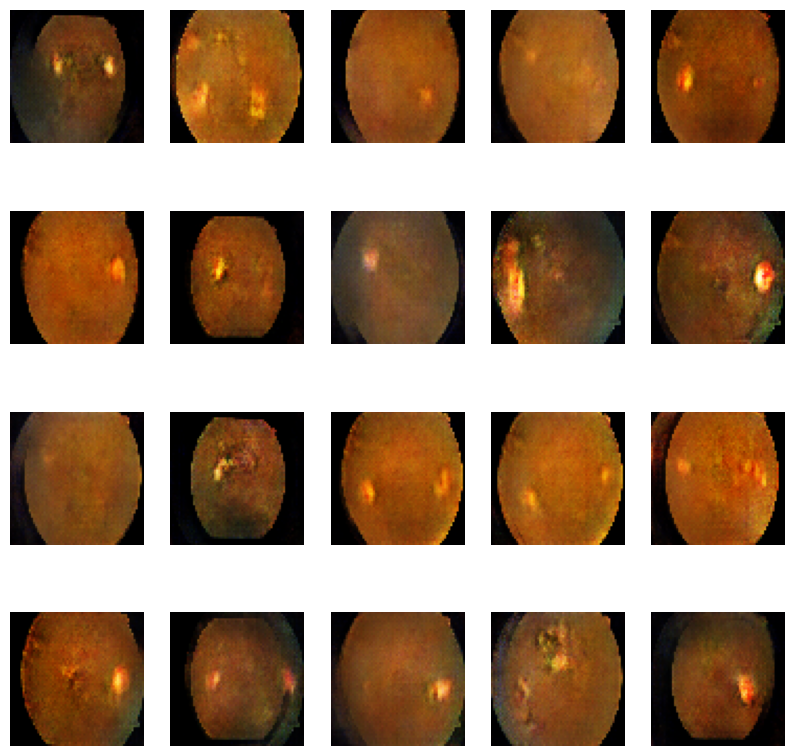

In [99]:
plt.figure(figsize=(10, 10))
for i in range(20):
    plt.subplot(4, 5, i+1)
    plt.imshow(generated_images[i])
    plt.axis('off')
plt.show()


In [100]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow import keras
import cv2 
import os
import random

In [101]:
def load_dataset(path_dataset, target_size=(100,100)): 
    dataset = []
    labels = []

    for label in os.listdir(path_dataset):
        class_path = os.path.join(path_dataset, label)
        if not os.path.isdir(class_path):
            continue

        for fname in os.listdir(class_path):
            image_path = os.path.join(class_path, fname)
            image = cv2.imread(image_path)
            if image is None:
                print(f"Error loading image: {image_path}")
                continue

            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, target_size)

            # (Apply your usual CLAHE / red-channel enhancement / normalisation here)
            # image = preprocess(image)

            dataset.append(image)
            labels.append(label)

    return np.array(dataset), np.array(labels)

In [102]:
import os
import shutil
import numpy as np
from sklearn.model_selection import train_test_split
from tqdm import tqdm

# ==========================================
# 1. Input and Output Paths
# ==========================================
input_root = "/kaggle/input/created-dataset-db"
output_root = "/kaggle/working/split_dataset"

train_dir = os.path.join(output_root, "train")
val_dir   = os.path.join(output_root, "val")
test_dir  = os.path.join(output_root, "test")

# Clean previous output if exists
if os.path.exists(output_root):
    shutil.rmtree(output_root)

os.makedirs(train_dir)
os.makedirs(val_dir)
os.makedirs(test_dir)

# ==========================================
# 2. Class names (folders)
# ==========================================
class_names = sorted(os.listdir(input_root))
print("Classes found:", class_names)

# ==========================================
# 3. Split ratios
# ==========================================
train_ratio = 0.70
val_ratio   = 0.10
test_ratio  = 0.20

# ==========================================
# 4. Function to copy images
# ==========================================
def safe_copy(files, target_dir):
    os.makedirs(target_dir, exist_ok=True)
    for f in files:
        shutil.copy(f, os.path.join(target_dir, os.path.basename(f)))

# ==========================================
# 5. Split each class folder
# ==========================================
for cls in tqdm(class_names, desc="Splitting dataset"):
    class_path = os.path.join(input_root, cls)
    images = [
        os.path.join(class_path, img)
        for img in os.listdir(class_path)
        if img.lower().endswith((".png", ".jpg", ".jpeg"))
    ]

    if len(images) == 0:
        print(f"⚠️ No images found in class {cls}, skipping.")
        continue

    # Stratified-like split for image paths
    train_files, temp = train_test_split(
        images, train_size=train_ratio, random_state=42, shuffle=True
    )

    val_files, test_files = train_test_split(
        temp, test_size=test_ratio / (test_ratio + val_ratio),
        random_state=42, shuffle=True
    )

    # Output folders
    out_train = os.path.join(train_dir, cls)
    out_val   = os.path.join(val_dir, cls)
    out_test  = os.path.join(test_dir, cls)

    safe_copy(train_files, out_train)
    safe_copy(val_files, out_val)
    safe_copy(test_files, out_test)

print("✅ Train/Val/Test Split Completed Successfully!")
print(f"Saved under: {output_root}")

Classes found: ['Mild', 'Moderate', 'No_dr', 'Prolifirate', 'Severe']


Splitting dataset: 100%|██████████| 5/5 [01:00<00:00, 12.08s/it]

✅ Train/Val/Test Split Completed Successfully!
Saved under: /kaggle/working/split_dataset


In [105]:
BASE_OUT_DIR = "/kaggle/working/split_dataset"


train_root_for_model = os.path.join(BASE_OUT_DIR, "train")
val_root_for_model   = os.path.join(BASE_OUT_DIR, "val")
test_root_for_model  = os.path.join(BASE_OUT_DIR, "test")

train_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
    train_root_for_model,
    target_size=(100, 100),
    batch_size=32,
    class_mode='categorical',
    shuffle=True
)

val_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
    val_root_for_model,
    target_size=(100, 100),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

test_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
    test_root_for_model,
    target_size=(100, 100),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

Found 7000 images belonging to 5 classes.
Found 1000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.


In [106]:
import os
import numpy as np
import shutil
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, array_to_img

# ==========================================
# 1. Paths – CHANGE THESE TO MATCH YOUR SETUP
# ==========================================

# Root that contains train/val/test split (NO augmentation here)
SPLIT_ROOT = "/kaggle/working/split_dataset"

train_dir_in  = "/kaggle/working/split_dataset/train"
train_dir_out = "/kaggle/working/split_dataset/train_aug"

# If you want the augmented images to *replace* train/ or live inside the same folder,
# you can also do:
# train_dir_out = train_dir_in

# Clean target folder (only if you are using a separate train_aug folder)
if os.path.exists(train_dir_out) and (train_dir_out != train_dir_in):
    shutil.rmtree(train_dir_out)
os.makedirs(train_dir_out, exist_ok=True)

# ==========================================
# 2. Augmentation configuration
# ==========================================
datagen = ImageDataGenerator(
    rotation_range=15,
    zoom_range=0.1,
    horizontal_flip=True
)

# Desired number of *augmented* images per class (NOT counting originals)
AUG_PER_CLASS = 4000

# ==========================================
# 3. Helper: list class folders in train/
# ==========================================
class_names = [
    d for d in os.listdir(train_dir_in)
    if os.path.isdir(os.path.join(train_dir_in, d))
]

print("Classes found in train/:", class_names)

# Allowed extensions
VALID_EXT = (".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff")

# ==========================================
# 4. Augment each class in train only
# ==========================================
for class_name in tqdm(class_names, desc="Processing train classes"):
    in_class_dir  = os.path.join(train_dir_in, class_name)
    out_class_dir = os.path.join(train_dir_out, class_name)

    os.makedirs(out_class_dir, exist_ok=True)

    # 4.1 Collect original image paths for this class
    img_paths = [
        os.path.join(in_class_dir, fname)
        for fname in os.listdir(in_class_dir)
        if fname.lower().endswith(VALID_EXT)
    ]

    if len(img_paths) == 0:
        print(f"⚠️ No images found for class {class_name}, skipping.")
        continue

    print(f"\nClass '{class_name}': {len(img_paths)} original images")

    # 4.2 Generate AUG_PER_CLASS augmented images
    num_generated = 0
    img_index = 0

    with tqdm(total=AUG_PER_CLASS, desc=f"Augmenting {class_name}", leave=False) as pbar:
        while num_generated < AUG_PER_CLASS:
            # Cycle through originals
            src_path = img_paths[img_index % len(img_paths)]

            # Load and resize
            img = load_img(src_path, target_size=(100, 100))
            img_array = img_to_array(img)
            img_array = np.expand_dims(img_array, axis=0)

            # datagen.flow yields infinite augmented batches
            aug_iter = datagen.flow(img_array, batch_size=1)

            # Generate up to 5 images per loop
            this_round = min(5, AUG_PER_CLASS - num_generated)
            for _ in range(this_round):
                aug_img_array = next(aug_iter)[0]   # (100, 100, 3)
                aug_img = array_to_img(aug_img_array)

                save_path = os.path.join(
                    out_class_dir,
                    f"aug_{num_generated:05d}.png"
                )
                aug_img.save(save_path)

                num_generated += 1
                pbar.update(1)

            img_index += 1  # go to next original

print("✅ Train-only data augmentation complete.")
print(f"Augmented train set saved under: {train_dir_out}")

Classes found in train/: ['Severe', 'Prolifirate', 'Moderate', 'Mild', 'No_dr']


Processing train classes:   0%|          | 0/5 [00:00<?, ?it/s]


Class 'Severe': 1400 original images



Processing train classes:  20%|██        | 1/5 [00:22<01:29, 22.35s/it]


Class 'Prolifirate': 1400 original images



Processing train classes:  40%|████      | 2/5 [00:45<01:08, 22.85s/it]     


Class 'Moderate': 1400 original images



Processing train classes:  60%|██████    | 3/5 [01:09<00:46, 23.24s/it]  


Class 'Mild': 1400 original images



Processing train classes:  80%|████████  | 4/5 [01:33<00:23, 23.69s/it]A


Class 'No_dr': 1400 original images



Processing train classes: 100%|██████████| 5/5 [01:55<00:00, 23.01s/it][A

✅ Train-only data augmentation complete.
Augmented train set saved under: /kaggle/working/split_dataset/train_aug


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Encode labels into numbers
label_encoder = LabelEncoder()
encoded_labels = label_encoder.fit_transform(labels)



X_train, X_temp, y_train, y_temp = train_test_split(dataset, encoded_labels, test_size=0.2, random_state=42)


X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)


def preprocess_image(image):
    resized_image = cv2.resize(image, (100,100))
    
    normalized_image = resized_image / 255.0
    return normalized_image


X_train = np.array([preprocess_image(image) for image in X_train])
X_test = np.array([preprocess_image(image) for image in X_test])
X_val = np.array([preprocess_image(image) for image in X_val])


print("Shape of X_train:", X_train.shape)
print("Shape of X_val:", X_val.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_val:", y_val.shape)
print("Shape of y_test:", y_test.shape)

In [107]:
import cv2
import os
import numpy as np
from tqdm import tqdm

def preprocess_and_save_with_subclasses2(input_dir, output_dir, target_size=(100,100)):
    """
    Preprocess images from input directory (with subclasses) and save to output directory.
    - Maintains the original folder structure (subclasses).
    - Applies image preprocessing: grayscale, CLAHE, Gaussian blur, Canny edge detection, and overlays edges in red.
    """
    # Initialize CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

    list1=os.listdir(input_dir)

    for subclass in list1:
        subclass_path = os.path.join(input_dir, subclass)
        if not os.path.isdir(subclass_path):
            continue  # Skip files, only process folders
        
        # Create corresponding subclass folder in the output directory
        output_subclass_path = os.path.join(output_dir, subclass)
        if not os.path.exists(output_subclass_path):
            os.makedirs(output_subclass_path)
        
        # Process each image in the subclass folder
        for image_name in tqdm(os.listdir(subclass_path), desc=f"Processing {subclass}"):
            image_path = os.path.join(subclass_path, image_name)
            image = cv2.imread(image_path)
            
            if image is None:
                continue  # Skip invalid files
            
            # Resize image
            image = cv2.resize(image, target_size)
            
            # Convert to grayscale
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            
            # Apply CLAHE for contrast enhancement
            clahe_enhanced = clahe.apply(gray)
            
            # Apply Gaussian blur to reduce noise
            blurred = cv2.GaussianBlur(clahe_enhanced, (5, 5), 0)
            
            # Apply Canny edge detection
            edges = cv2.Canny(blurred, threshold1=50, threshold2=150)
            
            # Create an RGB edge map (edges in red)
            edges_colored = np.zeros_like(image)  # Create a black RGB image
            edges_colored[:, :, 2] = edges  # Set red channel to edges
            
            # Overlay the edges onto the original image
            combined = cv2.addWeighted(image, 0.8, edges_colored, 0.5, 0)
            
            # Save the processed image to the corresponding output folder
            output_path = os.path.join(output_subclass_path, image_name)
            cv2.imwrite(output_path, combined)


import os
import numpy as np
import shutil
from tqdm import tqdm
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, array_to_img

# Paths for dataset folders
input_dataset = "/kaggle/input/created-dataset-db"
output_dataset = "/kaggle/working/dataset2"

# Ensure the output dataset directory exists
if os.path.exists(output_dataset):
    shutil.rmtree(output_dataset)  # Remove old dataset if it exists
os.makedirs(output_dataset)

# Define basic augmentation parameters
datagen = ImageDataGenerator(
    rotation_range=15,
    zoom_range=0.1,
    horizontal_flip=True
)

# Required class names
list1=os.listdir(input_dataset)
#required_classes = ["Mild", "Moderate", "No_DR", "Proliferate_DR", "Severe"]

# Process each class folder
for class_name in tqdm(list1, desc="Processing Classes"):
    class_path = os.path.join(input_dataset, class_name)
    
    if not os.path.exists(class_path):
        print(f"❌ Skipping {class_name}, folder not found.")
        continue
    
    # Create the new output class folder
    output_class_path = os.path.join(output_dataset, class_name)
    os.makedirs(output_class_path, exist_ok=True)
    
    # Load all images from the class folder
    images = [os.path.join(class_path, img) for img in os.listdir(class_path) if img.endswith(('png', 'jpg', 'jpeg'))]
    
    # Generate exactly 1000 augmented images
    num_images_generated = 0
    image_index = 0
    
    with tqdm(total=4000, desc=f"Augmenting {class_name}", leave=False) as pbar:
        while num_images_generated < 4000:
            img_path = images[image_index % len(images)]  # Loop through existing images
            img = load_img(img_path)  # Load image
            img = img.resize((100, 100))  # Resize to 100x100
            img_array = img_to_array(img)  # Convert to array
            img_array = np.expand_dims(img_array, axis=0)  # Expand dimensions
            
            # Generate augmented images
            aug_iter = datagen.flow(img_array, batch_size=1)
            for _ in range(min(4000 - num_images_generated, 5)):  # Generate up to 5 images per iteration
                augmented_img = array_to_img(next(aug_iter)[0])  # Convert back to image
                augmented_img = augmented_img.resize((100, 100))  # Resize again to ensure size
                save_path = os.path.join(output_class_path, f"aug_{num_images_generated}.png")
                augmented_img.save(save_path)  # Save image
                num_images_generated += 1
                pbar.update(1)  # Update progress bar
            
            image_index += 1  # Move to the next image

print("✅ Data augmentation complete. Augmented dataset saved in 'dataset7'.")


# Define input and output directories
input_directory = '/kaggle/working/dataset2'  # Contains subclass folders
output_directory = '/kaggle/working/dataset_preprocessed'  # Preprocessed images will be saved here

# Run preprocessing
preprocess_and_save_with_subclasses2(input_directory, output_directory)


In [108]:
import os

BASE_SPLIT_DIR = "/kaggle/working/split_dataset"
BASE_OUT_DIR   = "/kaggle/working/dataset_preprocessed"  # or any name you like

splits = ["train", "val", "test"]

for split in splits:
    input_directory  = os.path.join(BASE_SPLIT_DIR, split)          # e.g. /kaggle/working/split_dataset/train
    output_directory = os.path.join(BASE_OUT_DIR, split)            # e.g. /kaggle/working/dataset_preprocessed/train

    print(f"🔧 Preprocessing {split} split...")
    preprocess_and_save_with_subclasses2(input_directory, output_directory)

print("✅ All splits preprocessed successfully.")

🔧 Preprocessing train split...


Processing No_dr: 100%|██████████| 1400/1400 [00:02<00:00, 581.12it/s]


🔧 Preprocessing val split...


Processing No_dr: 100%|██████████| 200/200 [00:00<00:00, 590.18it/s]


🔧 Preprocessing test split...


Processing No_dr: 100%|██████████| 400/400 [00:00<00:00, 582.44it/s]

✅ All splits preprocessed successfully.


import os
import cv2
import numpy as np

def load_dataset(path_dataset, target_size=(100,100)): 
    dataset = []
    labels = []

    # Iterate over all folders in dataset_path
    for label in os.listdir(path_dataset):
        class_path = os.path.join(path_dataset, label)

        # check if the directory exists
        if os.path.isdir(class_path):
            # Initialize a counter for images in each class
            images_counter = 0
            
            # Iterate over all images in folder/class
            for image_name in os.listdir(class_path):
                image_path = os.path.join(class_path, image_name)

                # Load image with OpenCV
                image = cv2.imread(image_path)

                # Check if the image was loaded successfully
                if image is not None:
                    # Resize the image
                    image = cv2.resize(image, target_size)
                    # Get image dimensions
                    (h, w) = image.shape[:2]
                    
                    # Step 1: Apply random rotation between 0 to 5 degrees
                    angle = random.uniform(0, 5)  # Random angle between 0 and 5 degrees
                    center = (w // 2, h // 2)  # Center of the image
                    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)  # Rotation matrix
                    rotated_image = cv2.warpAffine(image, rotation_matrix, (w, h))
                    
                    # Step 2: Apply right-to-left flip
                    image = cv2.flip(rotated_image, 1)  # Flip horizontally
                    # Add image and label to dataset
                    dataset.append(image)
                    labels.append(label)


                else:
                    print(f"Error loading image: {image_path}")

    return np.array(dataset), np.array(labels)

dataset_path = "/kaggle/working/dataset_preprocessed"
dataset, labels = load_dataset(dataset_path)

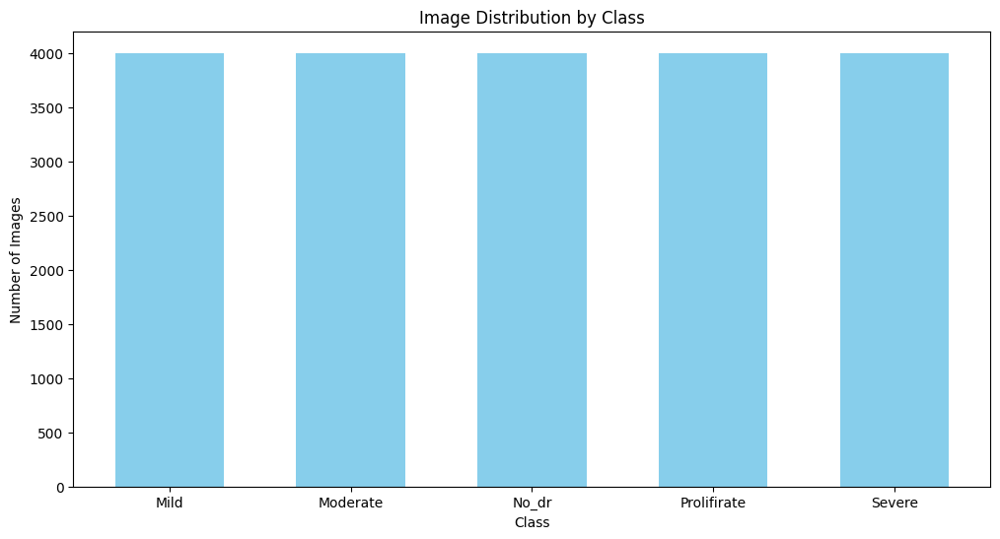

In [109]:
unique_labels, counts = np.unique(labels, return_counts=True)
class_counts = dict(zip(unique_labels, counts))

fig, ax = plt.subplots(figsize=(12, 6)) 
bars = ax.bar(class_counts.keys(), class_counts.values(), color='skyblue', width=0.6)  

ax.set_xlabel('Class')
ax.set_ylabel('Number of Images')
ax.set_title('Image Distribution by Class')

plt.show()

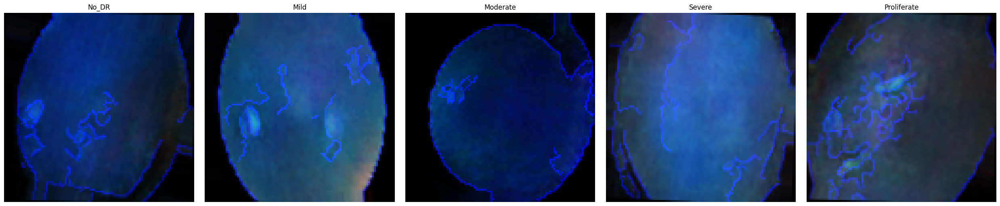

In [111]:
import numpy as np
import random
import matplotlib.pyplot as plt

def show_samples(images, labels, class_names, num_classes_to_show=5):
    """
    Displays 1 random sample image from each of the first N classes.
    
    images  → numpy array of images (H, W, 3)
    labels  → numeric labels (0..num_classes-1)
    class_names → list e.g. ['No_DR', 'Mild', 'Moderate', 'Severe', 'Proliferate']
    """
    
    num_classes_available = len(class_names)
    num_classes_to_show = min(num_classes_to_show, num_classes_available)

    plt.figure(figsize=(5 * num_classes_to_show, 5))

    for i in range(num_classes_to_show):
        class_idx = i
        class_name = class_names[class_idx]

        # indices belonging to this class
        indices = np.where(labels == class_idx)[0]

        if len(indices) == 0:
            print(f"⚠ No samples for class: {class_name}")
            continue

        # pick a random image index for that class
        sample_idx = random.choice(indices)
        
        img = images[sample_idx]

        # images are already RGB; no conversion needed
        plt.subplot(1, num_classes_to_show, i + 1)
        plt.imshow(img)
        plt.title(class_name)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

class_names = ['No_DR','Mild','Moderate','Severe','Proliferate']
show_samples(X_test, y_test, class_names, num_classes_to_show=5)

In [112]:
!pip install efficientnet

from efficientnet.tfkeras import EfficientNetB0
from tensorflow.keras import models
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout, Flatten, GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l1
from tensorflow.keras.optimizers import RMSprop
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import numpy as np

# Define the number of classes
num_classes = len(np.unique(labels))

# Load EfficientNetB0 without the top classification layers
efficientnet_model = EfficientNetB0(input_shape=(100,100, 3), include_top=False, weights='/kaggle/input/efficientnet/tensorflow2/default/1/efficientnet-b0_weights_tf_dim_ordering_tf_kernels_autoaugment_notop.h5')

# Create a new model
inputs = efficientnet_model.input

# Get the output of the last convolutional layer for Grad-CAM
conv_output = efficientnet_model.layers[-1].output

# Add a Global Average Pooling layer
x = GlobalAveragePooling2D()(conv_output)

# Add dense layers on top
x = Dense(128, kernel_regularizer=l1(0.0001), activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)

x = Dense(64, kernel_regularizer=l1(0.0001), activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)

x = Dense(32, kernel_regularizer=l1(0.0001), activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)

# Final classification layer
outputs = Dense(units=num_classes, activation='softmax')(x)

# Combine into the model
model = models.Model(inputs=inputs, outputs=outputs)

# Define Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True)

# Compile the model
custom_optimizer = RMSprop(learning_rate=0.0001)
model.compile(optimizer=custom_optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=30, validation_data=(X_val, y_val))


In [115]:
train_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
    train_root_for_model,
    target_size=(100, 100),
    batch_size=32,
    class_mode="categorical"
)

val_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
    val_root_for_model,
    target_size=(100, 100),
    batch_size=32,
    class_mode="categorical"
)

num_classes = train_gen.num_classes

optimizer = optimizers.RMSprop(learning_rate=1e-4)

model.compile(
    optimizer=optimizer,
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

history = model.fit(
    train_gen,
    epochs=60,
    validation_data=val_gen,
    callbacks=[early_stopping]
)

Found 7000 images belonging to 5 classes.
Found 1000 images belonging to 5 classes.
Epoch 1/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - accuracy: 0.8986 - loss: 0.6299 - val_accuracy: 0.9570 - val_loss: 0.4592
Epoch 2/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - accuracy: 0.9017 - loss: 0.6316 - val_accuracy: 0.9620 - val_loss: 0.4413
Epoch 3/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - accuracy: 0.9086 - loss: 0.5951 - val_accuracy: 0.9640 - val_loss: 0.4386
Epoch 4/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - accuracy: 0.9090 - loss: 0.5903 - val_accuracy: 0.9590 - val_loss: 0.4438
Epoch 5/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - accuracy: 0.9167 - loss: 0.5820 - val_accuracy: 0.9590 - val_loss: 0.4328
Epoch 6/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.9117 - loss: 0.5987 - val_accuracy: 0.9530 - val_loss: 0.4615
Epoch 7/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - accuracy: 0.9191 - loss: 0.5581 - val_accuracy: 0.9700 - val_loss: 0.4116
Epoch 8/60


In [ ]:
# Save the weights of the model to a file
model.save_weights('efficientnet_db.weights.h5')

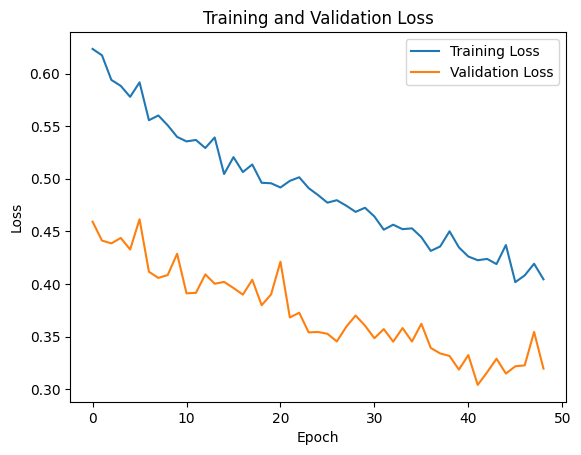

In [116]:
# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

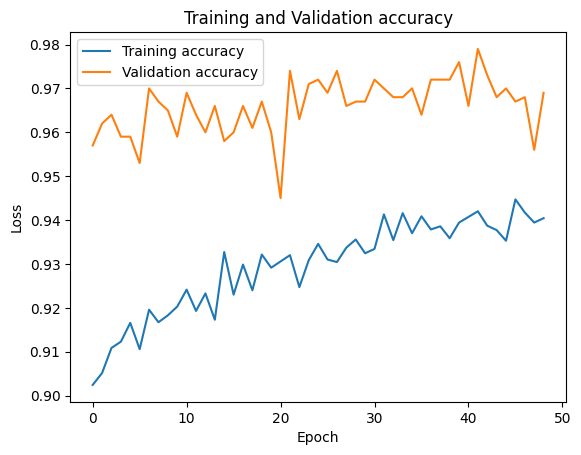

In [117]:
# Plot training and validation loss
plt.plot(history.history['accuracy'], label='Training accuracy')
plt.plot(history.history['val_accuracy'], label='Validation accuracy')
plt.title('Training and Validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

63/63 ━━━━━━━━━━━━━━━━━━━━ 11s 91ms/step
Test Accuracy: 0.4095


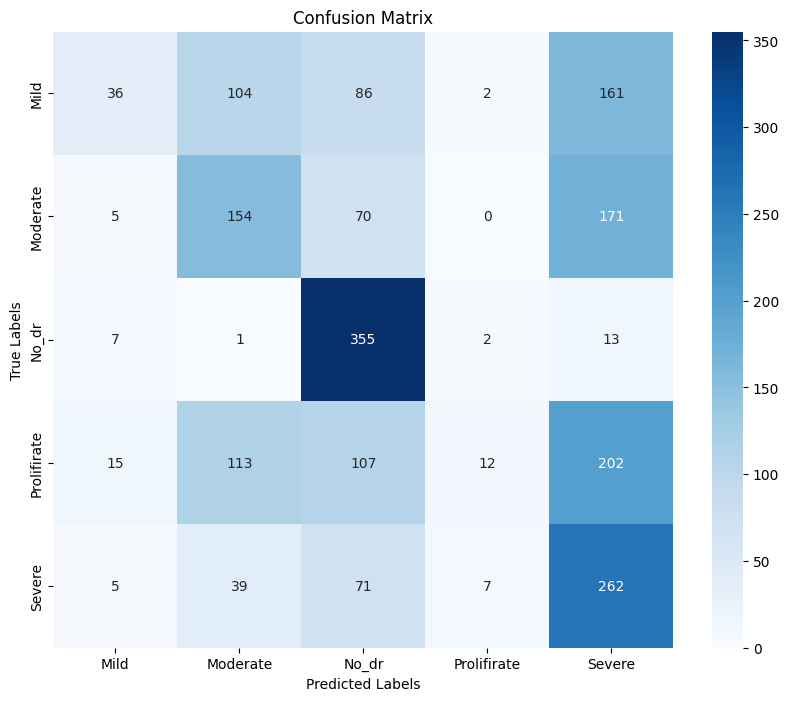

Classification Report:
              precision    recall  f1-score   support

        Mild     0.5294    0.0925    0.1575       389
    Moderate     0.3747    0.3850    0.3798       400
       No_dr     0.5152    0.9392    0.6654       378
 Prolifirate     0.5217    0.0267    0.0508       449
      Severe     0.3239    0.6823    0.4392       384

    accuracy                         0.4095      2000
   macro avg     0.4530    0.4251    0.3386      2000
weighted avg     0.4546    0.4095    0.3281      2000



In [118]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Get predictions and predicted classes
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# True labels
y_true = y_test

# Calculate test accuracy
test_accuracy = accuracy_score(y_true, y_pred_classes)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Confusion Matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Plot Confusion Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
            xticklabels=label_encoder.classes_, 
            yticklabels=label_encoder.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Classification Report
print("Classification Report:")
print(classification_report(y_true, y_pred_classes, target_names=label_encoder.classes_, digits=4))


In [119]:
import os
import numpy as np
from glob import glob
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# -----------------------------------------
# 1. Point to the Severe class folder
# -----------------------------------------
data_dir = "/kaggle/input/diabetic-retinopathy-224x224-2019-data/colored_images/Severe"

# All PNG / JPG files
image_paths = glob(os.path.join(data_dir, "*.png")) + glob(os.path.join(data_dir, "*.jpg"))
print("Number of Severe images found:", len(image_paths))

# -----------------------------------------
# 2. Loader consistent with your DCGAN
#    (64×64, scaled to [-1, 1])
# -----------------------------------------
def load_and_preprocess_image(path):
    img = load_img(path, target_size=(64, 64))
    img = img_to_array(img).astype("float32")
    img = (img - 127.5) / 127.5     # [-1, 1] as used in GAN
    return img

# Build a 4D tensor: (N, 64, 64, 3)
real_images = np.stack([load_and_preprocess_image(p) for p in image_paths], axis=0)

print("real_images shape:", real_images.shape)
print("real_images dtype:", real_images.dtype)
print("real_images range:", real_images.min(), "→", real_images.max())

Number of Severe images found: 193
real_images shape: (193, 64, 64, 3)
real_images dtype: float32
real_images range: -1.0 → 1.0


In [120]:
import os
import numpy as np
from glob import glob
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# -----------------------------------------
# 1. Point to the Severe class folder
# -----------------------------------------
data_dir = "/kaggle/input/diabetic-retinopathy-224x224-2019-data/colored_images/Severe"

# All PNG / JPG files
image_paths = glob(os.path.join(data_dir, "*.png")) + glob(os.path.join(data_dir, "*.jpg"))
print("Number of Severe images found:", len(image_paths))

# -----------------------------------------
# 2. Loader consistent with your DCGAN
#    (64×64, scaled to [-1, 1])
# -----------------------------------------
def load_and_preprocess_image(path):
    img = load_img(path, target_size=(64, 64))
    img = img_to_array(img).astype("float32")
    img = (img - 127.5) / 127.5     # [-1, 1] as used in GAN
    return img

# Build a 4D tensor: (N, 64, 64, 3)
real_images = np.stack([load_and_preprocess_image(p) for p in image_paths], axis=0)

print("real_images shape:", real_images.shape)
print("real_images dtype:", real_images.dtype)
print("real_images range:", real_images.min(), "→", real_images.max())




import tensorflow as tf

# How many samples to compare
N_SAMPLES = min(500, real_images.shape[0])   # or any number ≤ number of Severe images

# Sample N_SAMPLES real images
idx_real = np.random.choice(real_images.shape[0], size=N_SAMPLES, replace=False)
real_batch = real_images[idx_real]   # [-1, 1]

# Generate N_SAMPLES fake Severe images
noise = tf.random.normal([N_SAMPLES, noise_dim])
fake_batch = generator(noise, training=False).numpy()   # [-1, 1]

# Convert both to [0, 1] for SSIM / FID
real_01 = (real_batch + 1.0) / 2.0
fake_01 = (fake_batch + 1.0) / 2.0

print("Real batch:", real_01.shape, real_01.min(), real_01.max())
print("Fake batch:", fake_01.shape, fake_01.min(), fake_01.max())





from skimage.metrics import structural_similarity as ssim

def compute_mean_ssim(real_imgs, fake_imgs, n_pairs=100):
    """
    Compute average SSIM between random real–fake pairs.
    real_imgs, fake_imgs: (N, 64, 64, 3) scaled to [0,1]
    """
    n_pairs = min(n_pairs, real_imgs.shape[0], fake_imgs.shape[0])
    scores = []

    for _ in range(n_pairs):
        i = np.random.randint(0, real_imgs.shape[0])
        j = np.random.randint(0, fake_imgs.shape[0])

        r = real_imgs[i]
        f = fake_imgs[j]

        # ssim expects H×W×C in [0,1]
        s = ssim(r, f, channel_axis=-1, data_range=1.0)
        scores.append(s)

    return np.mean(scores), np.std(scores)

mean_ssim, std_ssim = compute_mean_ssim(real_01, fake_01, n_pairs=100)
print(f"Mean SSIM (real vs fake Severe): {mean_ssim:.4f} ± {std_ssim:.4f}")





import tensorflow as tf
import numpy as np
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from scipy import linalg

# ---------------------------------------------
# 1. Build InceptionV3 feature extractor
#    (standard backbone for FID)
# ---------------------------------------------
fid_model = InceptionV3(
    include_top=False,
    weights='imagenet',   # uses TF-hosted weights, not the broken EfficientNet URL
    pooling='avg',
    input_shape=(299, 299, 3)
)

print("FID backbone output shape:", fid_model.output_shape)

# ---------------------------------------------
# 2. Helper to get features
# ---------------------------------------------
def get_features_inception(model, imgs_01, batch_size=32):
    """
    imgs_01 : (N, H, W, 3) in [0,1]
    Returns: (N, feature_dim) Inception features
    """
    # Resize to 299×299
    imgs_resized = tf.image.resize(imgs_01, (299, 299))
    # Scale to [0,255] then preprocess for Inception
    imgs_pp = preprocess_input(imgs_resized * 255.0)
    feats = model.predict(imgs_pp, batch_size=batch_size, verbose=0)
    return feats

# ---------------------------------------------
# 3. Compute activations for real & fake
# ---------------------------------------------
real_feats = get_features_inception(fid_model, real_01)
fake_feats = get_features_inception(fid_model, fake_01)

print("Feature shapes (real, fake):", real_feats.shape, fake_feats.shape)

# ---------------------------------------------
# 4. FID implementation
# ---------------------------------------------
def compute_fid(mu1, sigma1, mu2, sigma2):
    """
    Classic FID computation:
        FID = ||mu1 - mu2||^2 + Tr(sigma1 + sigma2 - 2*sqrt(sigma1*sigma2))
    """
    diff = mu1 - mu2

    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if np.iscomplexobj(covmean):
        covmean = covmean.real

    fid = diff.dot(diff) + np.trace(sigma1 + sigma2 - 2.0 * covmean)
    return float(fid)

mu_real = np.mean(real_feats, axis=0)
sigma_real = np.cov(real_feats, rowvar=False)

mu_fake = np.mean(fake_feats, axis=0)
sigma_fake = np.cov(fake_feats, rowvar=False)

fid_value = compute_fid(mu_real, sigma_real, mu_fake, sigma_fake)
print(f"✅ FID (Severe real vs Severe fake): {fid_value:.2f}")

Real batch: (193, 64, 64, 3) 0.0 1.0
Fake batch: (193, 64, 64, 3) 0.0 0.9999984


Random correctly classified index per class: {1: 1290, 4: 1820}


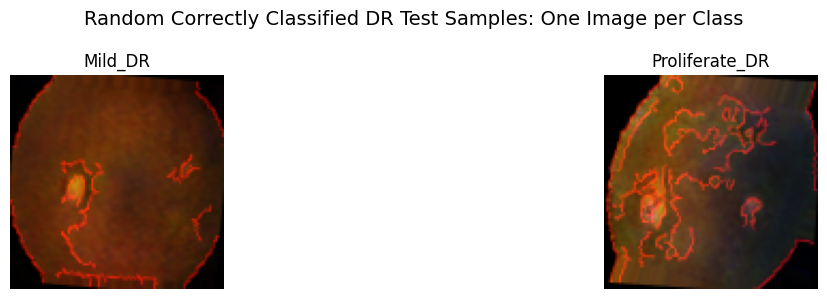

✅ Saved test-sample grid figure to: /kaggle/working/ch5_figures/ch5_test_samples_per_class.png


In [136]:
import numpy as np
import matplotlib.pyplot as plt
import os

# Assumptions (already defined in your notebook):
# X_test : (N, 100, 100, 3)  – test images
# y_test : (N,)              – integer labels 0..4
# proto_model                – trained prototype model
# get_proto_sim_from_array   – function that returns (sim_map, scores)
# class_names                – list of class labels

class_names = ['No_DR','Mild_DR','Moderate_DR','Severe_DR','Proliferate_DR']
num_classes = len(class_names)

# ------------------------------------------
# 1. Get predictions on the test set
# ------------------------------------------
y_pred_probs = proto_model.predict(X_test, verbose=0)
y_pred = np.argmax(y_pred_probs, axis=1)

# ------------------------------------------
# 2. For each class, pick ONE RANDOM correctly classified index
# ------------------------------------------
np.random.seed(42)  # reproducible randomness

correct_indices_by_class = {}

for c in range(num_classes):
    correct_idx = np.where((y_test == c) & (y_pred == c))[0]
    if len(correct_idx) > 0:
        chosen = np.random.choice(correct_idx)
        correct_indices_by_class[c] = chosen

print("Random correctly classified index per class:", correct_indices_by_class)

# ------------------------------------------
# 3. Plot them in a grid (Figure: Example DR Test Samples)
# ------------------------------------------
plt.figure(figsize=(15, 3))

for i, (c, idx) in enumerate(correct_indices_by_class.items(), start=1):
    ax = plt.subplot(1, len(correct_indices_by_class), i)
    img = X_test[idx]

    # Ensure correct display range
    img_disp = img.copy().astype("float32")
    if img_disp.max() > 1.0:
        img_disp /= 255.0

    # 🔥 Fix BLUE Tint (OpenCV loads as BGR, Matplotlib wants RGB)
    img_disp = img_disp[..., ::-1]   # BGR → RGB

    ax.imshow(img_disp)
    ax.set_title(class_names[c])
    ax.axis("off")

plt.suptitle("Random Correctly Classified DR Test Samples: One Image per Class", fontsize=14)
plt.tight_layout()

# Optional: save the figure for Chapter 5
os.makedirs("/kaggle/working/ch5_figures", exist_ok=True)
test_grid_path = "/kaggle/working/ch5_figures/ch5_test_samples_per_class.png"
plt.savefig(test_grid_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"✅ Saved test-sample grid figure to: {test_grid_path}")

=== Classification Report (Macro & Per-Class) ===
                precision    recall  f1-score   support

          Mild     0.0000    0.0000    0.0000       389
      Moderate     0.3824    0.0325    0.0599       400
         No_DR     0.0000    0.0000    0.0000       378
Proliferate_DR     0.0000    0.0000    0.0000       449
        Severe     0.1948    0.9974    0.3260       384

      accuracy                         0.1980      2000
     macro avg     0.1154    0.2060    0.0772      2000
  weighted avg     0.1139    0.1980    0.0746      2000



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


<Figure size 600x600 with 0 Axes>

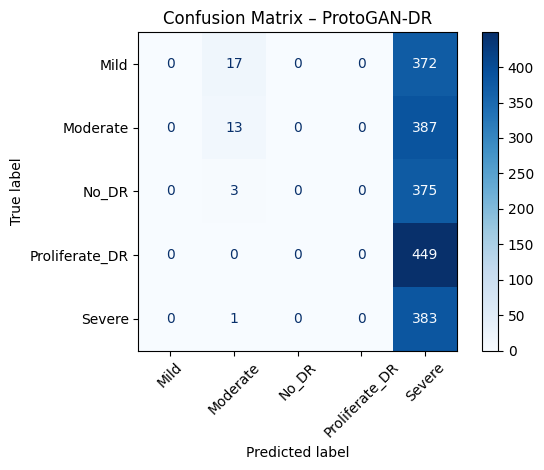

✅ Cohen's Kappa (agreement beyond chance): 0.0073


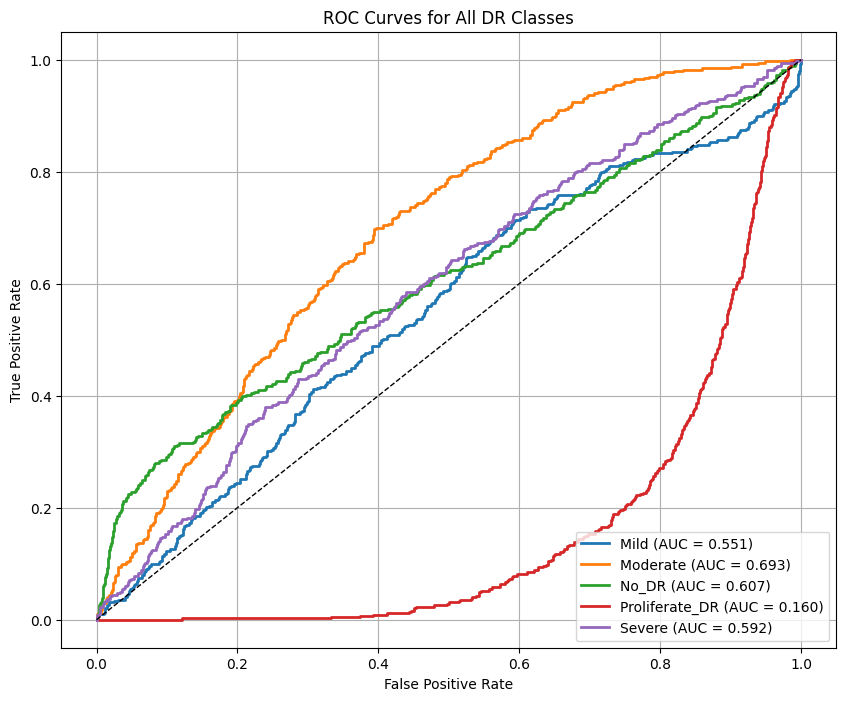

Detected minority indices: [3, 4]


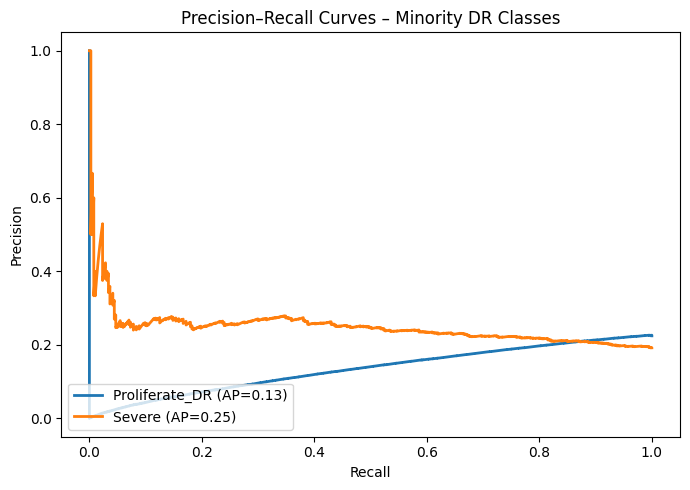


Brier Score (probability calibration, lower is better): 0.3336
Interpretation: lower Brier score = better calibrated confidence.


In [152]:
# ============================================
# Classification Evaluation – Rich Metrics
# ============================================
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_curve,
    roc_auc_score,
    precision_recall_curve,
    average_precision_score,
    cohen_kappa_score,
    ConfusionMatrixDisplay,
    auc,
    brier_score_loss
)

# --------------------------------------------
# 1. Basic metrics & confusion matrix
# --------------------------------------------
num_classes = len(class_names)

print("=== Classification Report (Macro & Per-Class) ===")
print(classification_report(y_test, y_pred, target_names=class_names, digits=4))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
plt.figure(figsize=(6, 6))
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix – ProtoGAN-DR")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Cohen's Kappa
kappa = cohen_kappa_score(y_test, y_pred)
print(f"✅ Cohen's Kappa (agreement beyond chance): {kappa:.4f}")

# --------------------------------------------
# 2. ROC & AUC (one-vs-rest)
# --------------------------------------------
# One-hot encode y_test
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Convert labels to one-hot
y_test_oh = tf.keras.utils.to_categorical(y_test, num_classes)

# 🚨 FIX: Get predicted probabilities
y_pred_proba = proto_model.predict(X_test, verbose=0)

fpr = {}
tpr = {}
roc_auc = {}

for c in range(num_classes):
    fpr[c], tpr[c], _ = roc_curve(y_test_oh[:, c], y_pred_proba[:, c])
    roc_auc[c] = auc(fpr[c], tpr[c])

# Plot ROC Curves
plt.figure(figsize=(10, 8))

for c in range(num_classes):
    plt.plot(fpr[c], tpr[c], lw=2,
             label=f'{class_names[c]} (AUC = {roc_auc[c]:.3f})')

plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All DR Classes')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# --------------------------------------------
# 3. Precision–Recall for minority classes
#    (Severe & Proliferate_DR)
# --------------------------------------------
minority_labels = ["Severe", "Proliferate"]  # substrings

minority_indices = [i for i, name in enumerate(class_names)
                    if any(lbl.lower() in name.lower() for lbl in minority_labels)]

print("Detected minority indices:", minority_indices)

plt.figure(figsize=(7, 5))
for idx, c in enumerate(minority_indices):
    precision, recall, _ = precision_recall_curve(y_test_oh[:, c], y_pred_proba[:, c])
    ap = average_precision_score(y_test_oh[:, c], y_pred_proba[:, c])
    plt.plot(recall, precision, lw=2, label=f"{class_names[c]} (AP={ap:.2f})")

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision–Recall Curves – Minority DR Classes")
plt.legend(loc="lower left")
plt.tight_layout()
plt.show()

# --------------------------------------------
# 4. Calibration – Brier score (overall)
# --------------------------------------------
# For calibration we can use the predicted probability
# of the predicted class for each sample
p_hat = np.max(y_pred_proba, axis=1)
y_true_binary = (y_pred == y_test).astype(int)  # correct vs incorrect

brier = brier_score_loss(y_true_binary, p_hat)
print(f"\nBrier Score (probability calibration, lower is better): {brier:.4f}")
print("Interpretation: lower Brier score = better calibrated confidence.")

Classes: ['Mild', 'Moderate', 'No_DR', 'Proliferate_DR', 'Severe']


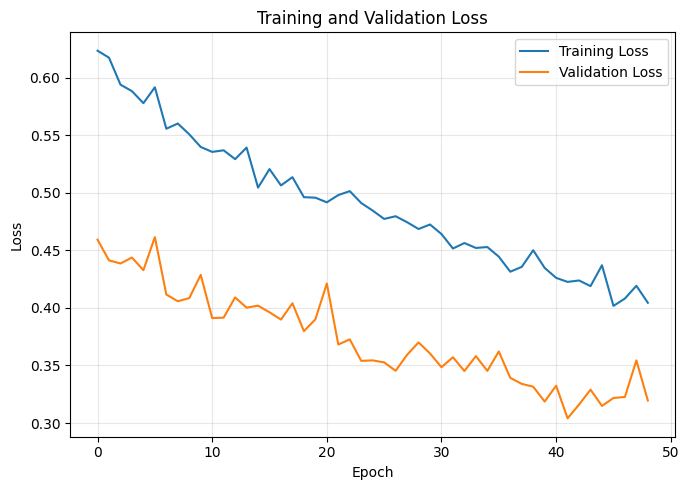

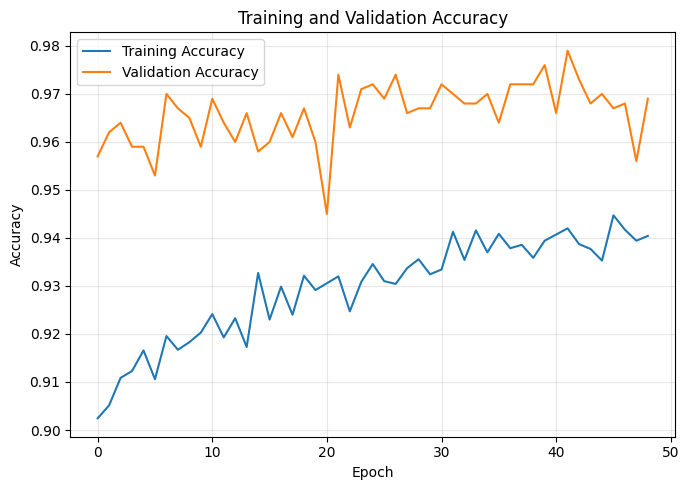


>>> Running predictions on test set...

========== Overall Test Performance ==========
Overall Accuracy          : 0.4095
Balanced Accuracy         : 0.4251
Macro Precision           : 0.4530
Macro Recall (Sensitivity): 0.4251
Macro F1-score            : 0.3386
Macro Specificity         : 0.8536
Cohen's Kappa (linear)    : 0.2368
Cohen's Kappa (quadratic) : 0.1892
Matthews Corr. Coeff.     : 0.2949

Per-class Sensitivity (Recall):
             Mild: 0.0925
         Moderate: 0.3850
            No_DR: 0.9392
   Proliferate_DR: 0.0267
           Severe: 0.6823

Per-class Specificity:
             Mild: 0.9801
         Moderate: 0.8394
            No_DR: 0.7941
   Proliferate_DR: 0.9929
           Severe: 0.6615

Classification Report (per class):
                precision    recall  f1-score   support

          Mild     0.5294    0.0925    0.1575       389
      Moderate     0.3747    0.3850    0.3798       400
         No_DR     0.5152    0.9392    0.6654       378
Proliferate_DR     

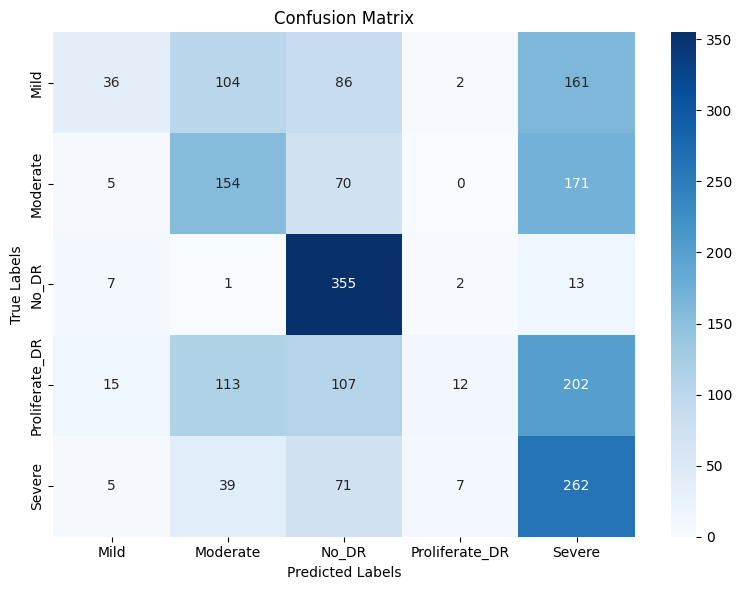


>>> Computing ROC curves and AUC...


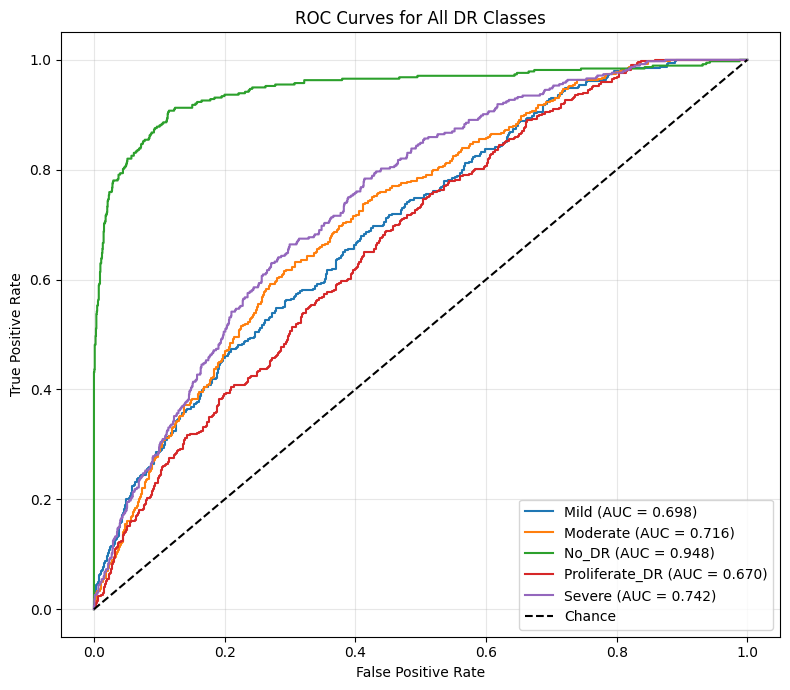


>>> Computing Precision–Recall curves for minority classes...


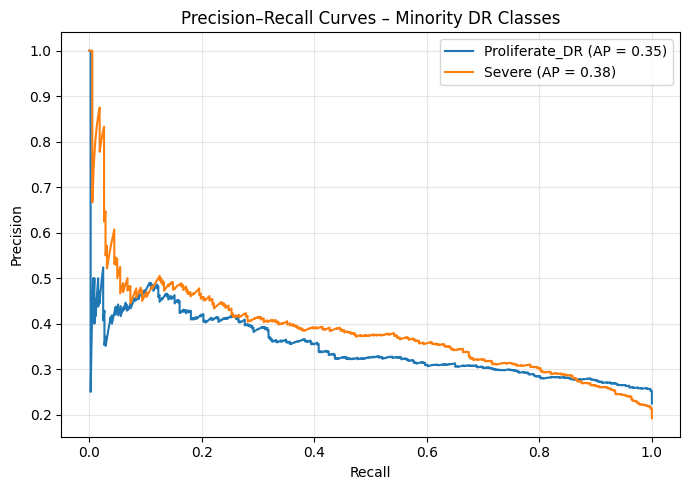


✅ Full evaluation complete: loss/accuracy curves, confusion matrix, classification metrics, ROC–AUC, and PR curves.


In [153]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    accuracy_score,
    precision_recall_fscore_support,
    balanced_accuracy_score,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)
from sklearn.preprocessing import label_binarize

# ============================================
# 0. Get class names
# ============================================
try:
    class_names = class_names  # if already defined
except NameError:
    try:
        class_names = list(label_encoder.classes_)
    except NameError:
        raise ValueError("Please define either `class_names` or `label_encoder` before running this block.")

num_classes = len(class_names)
print("Classes:", class_names)

# ============================================
# 1. Plot training history (loss & accuracy)
# ============================================
if 'history' in globals():
    # Loss
    plt.figure(figsize=(7, 5))
    plt.plot(history.history['loss'], label='Training Loss')
    if 'val_loss' in history.history:
        plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Accuracy
    acc_key = 'accuracy'
    if acc_key not in history.history:
        # in case it's called 'categorical_accuracy'
        if 'categorical_accuracy' in history.history:
            acc_key = 'categorical_accuracy'

    if acc_key in history.history:
        plt.figure(figsize=(7, 5))
        plt.plot(history.history[acc_key], label='Training Accuracy')
        if 'val_' + acc_key in history.history:
            plt.plot(history.history['val_' + acc_key], label='Validation Accuracy')
        plt.title('Training and Validation Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
else:
    print("⚠️ `history` object not found – skipping loss/accuracy plots.")

# ============================================
# 2. Predictions on test set
# ============================================
print("\n>>> Running predictions on test set...")
y_pred_proba = model.predict(X_test, verbose=0)   # shape: (N, num_classes)
y_pred = np.argmax(y_pred_proba, axis=1)
y_true = y_test

from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    accuracy_score,
    precision_recall_fscore_support,
    balanced_accuracy_score,
    cohen_kappa_score,
    matthews_corrcoef
)

# --------------------------------------------
# 3. Core classification & agreement metrics
# --------------------------------------------
test_accuracy = accuracy_score(y_true, y_pred)
balanced_acc = balanced_accuracy_score(y_true, y_pred)
macro_prec, macro_rec, macro_f1, support = precision_recall_fscore_support(
    y_true, y_pred, average='macro'
)

# Cohen’s kappa (linear & quadratic – important for DR)
kappa_linear = cohen_kappa_score(y_true, y_pred, weights='linear')
kappa_quadratic = cohen_kappa_score(y_true, y_pred, weights='quadratic')

# Matthews Correlation Coefficient
mcc = matthews_corrcoef(y_true, y_pred)

# Per-class specificity (TN / (TN + FP))
conf_matrix = confusion_matrix(y_true, y_pred)
specificity_per_class = []
sensitivity_per_class = []  # recall per class

for i in range(num_classes):
    TP = conf_matrix[i, i]
    FN = conf_matrix[i, :].sum() - TP
    FP = conf_matrix[:, i].sum() - TP
    TN = conf_matrix.sum() - (TP + FP + FN)

    sensitivity = TP / (TP + FN + 1e-8)      # same as recall
    specificity = TN / (TN + FP + 1e-8)

    sensitivity_per_class.append(sensitivity)
    specificity_per_class.append(specificity)

macro_specificity = np.mean(specificity_per_class)

print("\n========== Overall Test Performance ==========")
print(f"Overall Accuracy          : {test_accuracy:.4f}")
print(f"Balanced Accuracy         : {balanced_acc:.4f}")
print(f"Macro Precision           : {macro_prec:.4f}")
print(f"Macro Recall (Sensitivity): {macro_rec:.4f}")
print(f"Macro F1-score            : {macro_f1:.4f}")
print(f"Macro Specificity         : {macro_specificity:.4f}")
print(f"Cohen's Kappa (linear)    : {kappa_linear:.4f}")
print(f"Cohen's Kappa (quadratic) : {kappa_quadratic:.4f}")
print(f"Matthews Corr. Coeff.     : {mcc:.4f}")

print("\nPer-class Sensitivity (Recall):")
for i, cls in enumerate(class_names):
    print(f"  {cls:>15}: {sensitivity_per_class[i]:.4f}")

print("\nPer-class Specificity:")
for i, cls in enumerate(class_names):
    print(f"  {cls:>15}: {specificity_per_class[i]:.4f}")

print("\nClassification Report (per class):")
print(classification_report(y_true, y_pred,
                            target_names=class_names,
                            digits=4))
# ============================================
# 4. Confusion Matrix
# ============================================
conf_matrix = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix,
            annot=True,
            fmt='d',
            cmap='Blues',
            xticklabels=class_names,
            yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.tight_layout()
plt.show()

# ============================================
# 5. ROC Curves & AUC (one-vs-rest)
# ============================================
print("\n>>> Computing ROC curves and AUC...")

# One-hot encode true labels
y_test_oh = label_binarize(y_true, classes=np.arange(num_classes))

fpr = {}
tpr = {}
roc_auc = {}

for c in range(num_classes):
    fpr[c], tpr[c], _ = roc_curve(y_test_oh[:, c], y_pred_proba[:, c])
    roc_auc[c] = auc(fpr[c], tpr[c])

plt.figure(figsize=(8, 7))
for c in range(num_classes):
    plt.plot(fpr[c], tpr[c],
             label=f"{class_names[c]} (AUC = {roc_auc[c]:.3f})")

# random baseline
plt.plot([0, 1], [0, 1], 'k--', label='Chance')

plt.title('ROC Curves for All DR Classes')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ============================================
# 6. Precision–Recall Curves (Minority Classes)
# ============================================
print("\n>>> Computing Precision–Recall curves for minority classes...")

# heurstic: treat any class name containing "Severe" or "Prolif" as minority
minority_labels = [c for c in class_names
                   if ('Severe' in c) or ('Prolif' in c) or ('Proliferate' in c)]

if len(minority_labels) == 0:
    # fallback: last 2 classes
    minority_indices = [num_classes - 2, num_classes - 1]
    minority_labels = [class_names[i] for i in minority_indices]
else:
    minority_indices = [class_names.index(c) for c in minority_labels]

plt.figure(figsize=(7, 5))

for idx in minority_indices:
    precision, recall, _ = precision_recall_curve(
        y_test_oh[:, idx], y_pred_proba[:, idx]
    )
    ap = average_precision_score(y_test_oh[:, idx], y_pred_proba[:, idx])
    plt.plot(recall, precision,
             label=f"{class_names[idx]} (AP = {ap:.2f})")

plt.title('Precision–Recall Curves – Minority DR Classes')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.grid(True, alpha=0.3)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

print("\n✅ Full evaluation complete: loss/accuracy curves, confusion matrix, "
      "classification metrics, ROC–AUC, and PR curves.")

In [154]:
print("Shapes → X_test:", X_test.shape, "y_test:", y_test.shape)
print("First 10 true labels   :", y_test[:10])

y_pred_proba = model.predict(X_test, verbose=0)
y_pred = np.argmax(y_pred_proba, axis=1)
print("First 10 predicted lab :", y_pred[:10])

print("Are y_test and y_pred the same object?  ", y_test is y_pred)
print("All elements equal?                      ", np.array_equal(y_test, y_pred))

Shapes → X_test: (2000, 100, 100, 3) y_test: (2000,)
First 10 true labels   : [2 0 1 3 0 3 4 2 4 0]
First 10 predicted lab : [2 1 4 2 4 4 1 2 4 1]
Are y_test and y_pred the same object?   False
All elements equal?                       False


In [155]:
from sklearn.metrics import confusion_matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion matrix:\n", conf_matrix)

Confusion matrix:
 [[ 36 104  86   2 161]
 [  5 154  70   0 171]
 [  7   1 355   2  13]
 [ 15 113 107  12 202]
 [  5  39  71   7 262]]


In [156]:
import os

SPLIT_ROOT = "/kaggle/working/split_dataset"   # <-- change to your split root
for phase in ["train", "val", "test"]:
    phase_dir = os.path.join(SPLIT_ROOT, phase)
    print(f"\n=== {phase.upper()} DIR: {phase_dir} ===")
    if not os.path.exists(phase_dir):
        print("  (does not exist)")
        continue
        
    class_folders = sorted([d for d in os.listdir(phase_dir) 
                            if os.path.isdir(os.path.join(phase_dir, d))])
    for d in class_folders:
        n_files = len([
            f for f in os.listdir(os.path.join(phase_dir, d))
            if f.lower().endswith((".png", ".jpg", ".jpeg"))
        ])
        print(f"  - {d:15s}  ({n_files} images)")


=== TRAIN DIR: /kaggle/working/split_dataset/train ===
  - Mild             (1400 images)
  - Moderate         (1400 images)
  - No_dr            (1400 images)
  - Prolifirate      (1400 images)
  - Severe           (1400 images)

=== VAL DIR: /kaggle/working/split_dataset/val ===
  - Mild             (200 images)
  - Moderate         (200 images)
  - No_dr            (200 images)
  - Prolifirate      (200 images)
  - Severe           (200 images)

=== TEST DIR: /kaggle/working/split_dataset/test ===
  - Mild             (400 images)
  - Moderate         (400 images)
  - No_dr            (400 images)
  - Prolifirate      (400 images)
  - Severe           (400 images)


In [158]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Assuming y_train are integer labels [0..4]
classes = np.unique(y_train)
class_weights = compute_class_weight(
    class_weight="balanced",
    classes=classes,
    y=y_train
)

class_weight_dict = {int(c): float(w) for c, w in zip(classes, class_weights)}
print("Class weights:", class_weight_dict)

history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=EPOCHS,
    callbacks=[early_stopping],
    class_weight=class_weight_dict
)

Class weights: {0: 1.0, 1: 1.0028204324663115, 2: 0.9950248756218906, 3: 1.0081915563957151, 4: 0.9940975458216837}
Epoch 1/30
219/219 ━━━━━━━━━━━━━━━━━━━━ 28s 64ms/step - accuracy: 0.9403 - loss: 0.4197 - val_accuracy: 0.9680 - val_loss: 0.3367
Epoch 2/30
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - accuracy: 0.9392 - loss: 0.4224 - val_accuracy: 0.9590 - val_loss: 0.3434
Epoch 3/30
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - accuracy: 0.9332 - loss: 0.4470 - val_accuracy: 0.9750 - val_loss: 0.3176
Epoch 4/30
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - accuracy: 0.9430 - loss: 0.4058 - val_accuracy: 0.9690 - val_loss: 0.3136
Epoch 5/30
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - accuracy: 0.9391 - loss: 0.4147 - val_accuracy: 0.9630 - val_loss: 0.3279
Epoch 6/30
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - accuracy: 0.9435 - loss: 0.4137 - val_accuracy: 0.9660 - val_loss: 0.3249
Epoch 7/30
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - accuracy: 0.9511 - loss: 0.3910 - val_accuracy: 0.9630

Classes: ['Mild', 'Moderate', 'No_DR', 'Proliferate_DR', 'Severe']


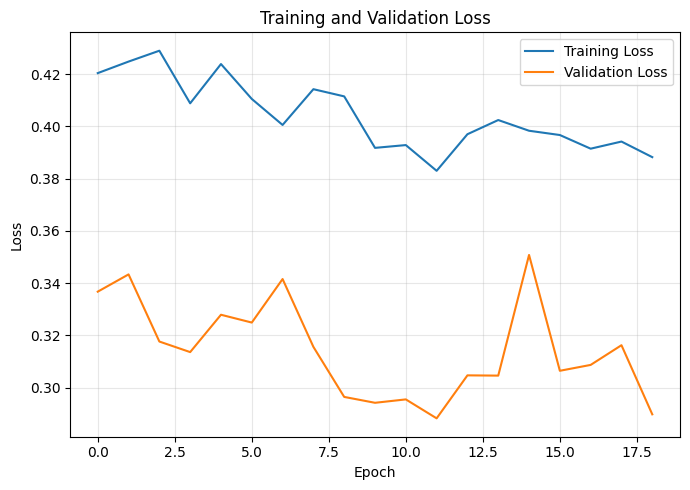

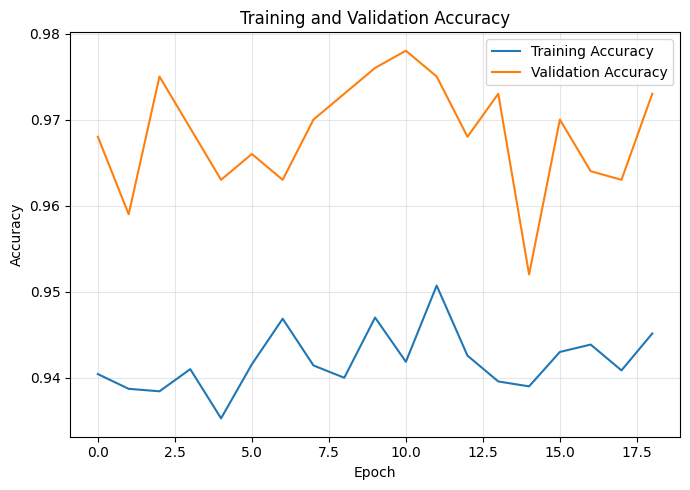


>>> Running predictions on test set...

========== Overall Test Performance ==========
Overall Accuracy          : 0.4475
Balanced Accuracy         : 0.4633
Macro Precision           : 0.4623
Macro Recall (Sensitivity): 0.4633
Macro F1-score            : 0.3968
Macro Specificity         : 0.8627
Cohen's Kappa (linear)    : 0.2912
Cohen's Kappa (quadratic) : 0.2619
Matthews Corr. Coeff.     : 0.3385

Per-class Sensitivity (Recall):
             Mild: 0.1748
         Moderate: 0.5375
            No_DR: 0.8942
   Proliferate_DR: 0.0200
           Severe: 0.6901

Per-class Specificity:
             Mild: 0.9714
         Moderate: 0.7431
            No_DR: 0.9149
   Proliferate_DR: 0.9871
           Severe: 0.6968

Classification Report (per class):
                precision    recall  f1-score   support

          Mild     0.5965    0.1748    0.2704       389
      Moderate     0.3435    0.5375    0.4191       400
         No_DR     0.7101    0.8942    0.7916       378
Proliferate_DR     

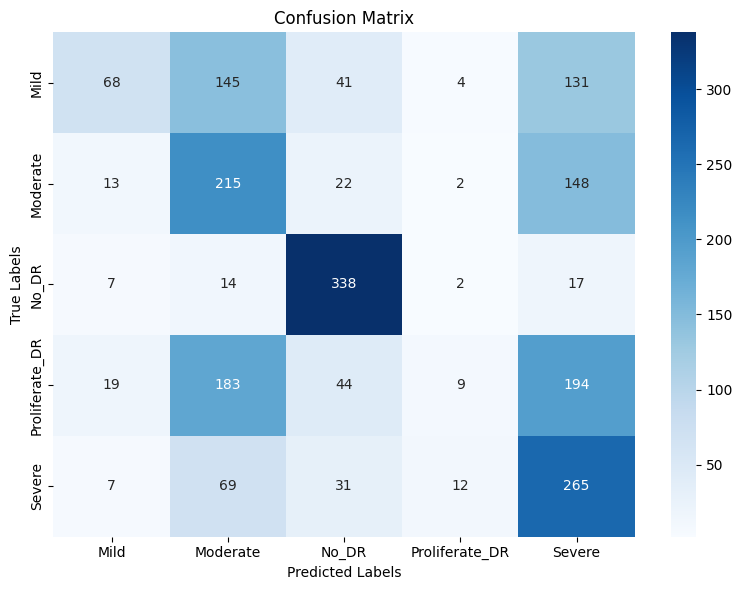


>>> Computing ROC curves and AUC...


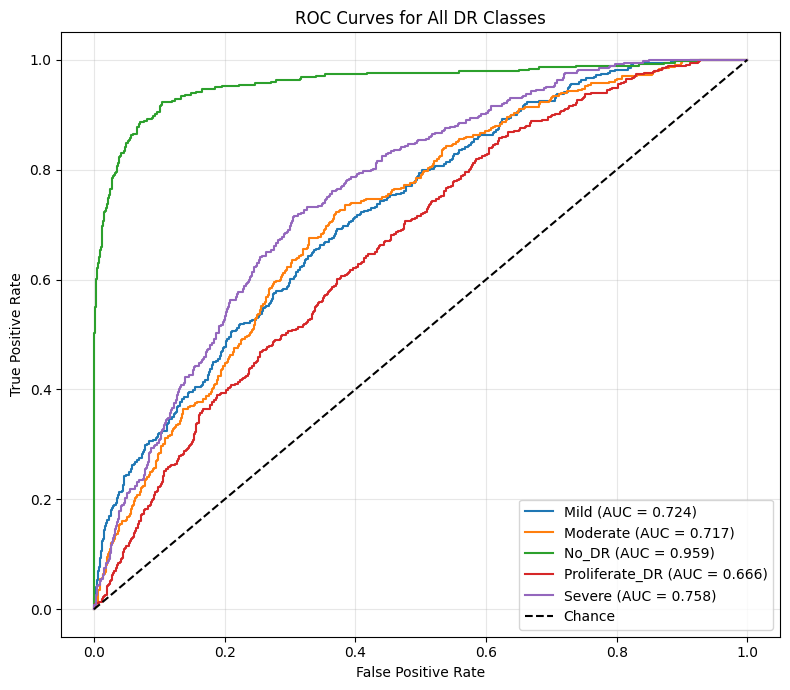


>>> Computing Precision–Recall curves for minority classes...


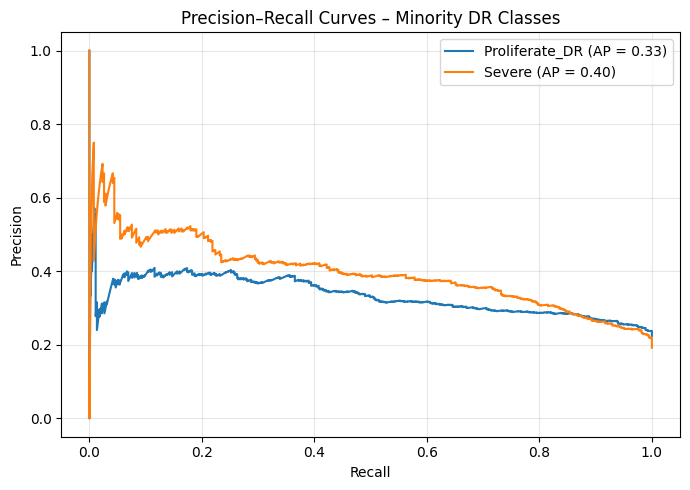


✅ Full evaluation complete: loss/accuracy curves, confusion matrix, classification metrics, ROC–AUC, and PR curves.


In [159]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    accuracy_score,
    precision_recall_fscore_support,
    balanced_accuracy_score,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score
)
from sklearn.preprocessing import label_binarize

# ============================================
# 0. Get class names
# ============================================
try:
    class_names = class_names  # if already defined
except NameError:
    try:
        class_names = list(label_encoder.classes_)
    except NameError:
        raise ValueError("Please define either `class_names` or `label_encoder` before running this block.")

num_classes = len(class_names)
print("Classes:", class_names)

# ============================================
# 1. Plot training history (loss & accuracy)
# ============================================
if 'history' in globals():
    # Loss
    plt.figure(figsize=(7, 5))
    plt.plot(history.history['loss'], label='Training Loss')
    if 'val_loss' in history.history:
        plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Accuracy
    acc_key = 'accuracy'
    if acc_key not in history.history:
        # in case it's called 'categorical_accuracy'
        if 'categorical_accuracy' in history.history:
            acc_key = 'categorical_accuracy'

    if acc_key in history.history:
        plt.figure(figsize=(7, 5))
        plt.plot(history.history[acc_key], label='Training Accuracy')
        if 'val_' + acc_key in history.history:
            plt.plot(history.history['val_' + acc_key], label='Validation Accuracy')
        plt.title('Training and Validation Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
else:
    print("⚠️ `history` object not found – skipping loss/accuracy plots.")

# ============================================
# 2. Predictions on test set
# ============================================
print("\n>>> Running predictions on test set...")
y_pred_proba = model.predict(X_test, verbose=0)   # shape: (N, num_classes)
y_pred = np.argmax(y_pred_proba, axis=1)
y_true = y_test

from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    accuracy_score,
    precision_recall_fscore_support,
    balanced_accuracy_score,
    cohen_kappa_score,
    matthews_corrcoef
)

# --------------------------------------------
# 3. Core classification & agreement metrics
# --------------------------------------------
test_accuracy = accuracy_score(y_true, y_pred)
balanced_acc = balanced_accuracy_score(y_true, y_pred)
macro_prec, macro_rec, macro_f1, support = precision_recall_fscore_support(
    y_true, y_pred, average='macro'
)

# Cohen’s kappa (linear & quadratic – important for DR)
kappa_linear = cohen_kappa_score(y_true, y_pred, weights='linear')
kappa_quadratic = cohen_kappa_score(y_true, y_pred, weights='quadratic')

# Matthews Correlation Coefficient
mcc = matthews_corrcoef(y_true, y_pred)

# Per-class specificity (TN / (TN + FP))
conf_matrix = confusion_matrix(y_true, y_pred)
specificity_per_class = []
sensitivity_per_class = []  # recall per class

for i in range(num_classes):
    TP = conf_matrix[i, i]
    FN = conf_matrix[i, :].sum() - TP
    FP = conf_matrix[:, i].sum() - TP
    TN = conf_matrix.sum() - (TP + FP + FN)

    sensitivity = TP / (TP + FN + 1e-8)      # same as recall
    specificity = TN / (TN + FP + 1e-8)

    sensitivity_per_class.append(sensitivity)
    specificity_per_class.append(specificity)

macro_specificity = np.mean(specificity_per_class)

print("\n========== Overall Test Performance ==========")
print(f"Overall Accuracy          : {test_accuracy:.4f}")
print(f"Balanced Accuracy         : {balanced_acc:.4f}")
print(f"Macro Precision           : {macro_prec:.4f}")
print(f"Macro Recall (Sensitivity): {macro_rec:.4f}")
print(f"Macro F1-score            : {macro_f1:.4f}")
print(f"Macro Specificity         : {macro_specificity:.4f}")
print(f"Cohen's Kappa (linear)    : {kappa_linear:.4f}")
print(f"Cohen's Kappa (quadratic) : {kappa_quadratic:.4f}")
print(f"Matthews Corr. Coeff.     : {mcc:.4f}")

print("\nPer-class Sensitivity (Recall):")
for i, cls in enumerate(class_names):
    print(f"  {cls:>15}: {sensitivity_per_class[i]:.4f}")

print("\nPer-class Specificity:")
for i, cls in enumerate(class_names):
    print(f"  {cls:>15}: {specificity_per_class[i]:.4f}")

print("\nClassification Report (per class):")
print(classification_report(y_true, y_pred,
                            target_names=class_names,
                            digits=4))
# ============================================
# 4. Confusion Matrix
# ============================================
conf_matrix = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix,
            annot=True,
            fmt='d',
            cmap='Blues',
            xticklabels=class_names,
            yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.tight_layout()
plt.show()

# ============================================
# 5. ROC Curves & AUC (one-vs-rest)
# ============================================
print("\n>>> Computing ROC curves and AUC...")

# One-hot encode true labels
y_test_oh = label_binarize(y_true, classes=np.arange(num_classes))

fpr = {}
tpr = {}
roc_auc = {}

for c in range(num_classes):
    fpr[c], tpr[c], _ = roc_curve(y_test_oh[:, c], y_pred_proba[:, c])
    roc_auc[c] = auc(fpr[c], tpr[c])

plt.figure(figsize=(8, 7))
for c in range(num_classes):
    plt.plot(fpr[c], tpr[c],
             label=f"{class_names[c]} (AUC = {roc_auc[c]:.3f})")

# random baseline
plt.plot([0, 1], [0, 1], 'k--', label='Chance')

plt.title('ROC Curves for All DR Classes')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ============================================
# 6. Precision–Recall Curves (Minority Classes)
# ============================================
print("\n>>> Computing Precision–Recall curves for minority classes...")

# heurstic: treat any class name containing "Severe" or "Prolif" as minority
minority_labels = [c for c in class_names
                   if ('Severe' in c) or ('Prolif' in c) or ('Proliferate' in c)]

if len(minority_labels) == 0:
    # fallback: last 2 classes
    minority_indices = [num_classes - 2, num_classes - 1]
    minority_labels = [class_names[i] for i in minority_indices]
else:
    minority_indices = [class_names.index(c) for c in minority_labels]

plt.figure(figsize=(7, 5))

for idx in minority_indices:
    precision, recall, _ = precision_recall_curve(
        y_test_oh[:, idx], y_pred_proba[:, idx]
    )
    ap = average_precision_score(y_test_oh[:, idx], y_pred_proba[:, idx])
    plt.plot(recall, precision,
             label=f"{class_names[idx]} (AP = {ap:.2f})")

plt.title('Precision–Recall Curves – Minority DR Classes')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.grid(True, alpha=0.3)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

print("\n✅ Full evaluation complete: loss/accuracy curves, confusion matrix, "
      "classification metrics, ROC–AUC, and PR curves.")

In [160]:
!pip install focal-loss

from focal_loss import SparseCategoricalFocalLoss

model.compile(
    optimizer=custom_optimizer,
    loss=SparseCategoricalFocalLoss(gamma=2),
    metrics=['accuracy']
)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.9/319.9 kB 7.4 MB/s eta 0:00:00:00:01
  Attempting uninstall: protobuf
    Found existing installation: protobuf 6.33.0
    Uninstalling protobuf-6.33.0:
      Successfully uninstalled protobuf-6.33.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.12.0 requires google-cloud-bigquery-storage<3.0.0,>=2.30.0, which is not installed.
google-cloud-translate 3.12.1 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.19.5, but you have protobuf 5.29.5 which is incompatible.
ray 2.51.1 requires click!=8.3.0,>=7.0, but you have click 8.3.0 which is incompatible.
bigframes 2.12.0 requires rich<14,>=12.4.4, but you have rich 14.2.0 which is incompatible.
pydrive2 1.21.3 requires cryptography<44, but you have cryptography 46.0.3 which is incompatible.
pydrive2 1.

⚠ Could not set memory growth: Physical devices cannot be modified after being initialized
Train dir: /kaggle/working/split_dataset/train
Val   dir: /kaggle/working/split_dataset/val
Test  dir: /kaggle/working/split_dataset/test
Found 7000 images belonging to 5 classes.
Found 1000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.

Class indices: {'Mild': 0, 'Moderate': 1, 'No_dr': 2, 'Prolifirate': 3, 'Severe': 4}
Class names  : ['Mild', 'Moderate', 'No_dr', 'Prolifirate', 'Severe']
Found 7000 images belonging to 5 classes.
Found 1000 images belonging to 5 classes.
Found 2000 images belonging to 5 classes.

Train class counts (by index): Counter({0: 1400, 1: 1400, 2: 1400, 3: 1400, 4: 1400})
Val   class counts (by index): Counter({0: 200, 1: 200, 2: 200, 3: 200, 4: 200})
Test  class counts (by index): Counter({0: 400, 1: 400, 2: 400, 3: 400, 4: 400})

Class weights: {0: 1.0, 1: 1.0, 2: 1.0, 3: 1.0, 4: 1.0}


Model: "functional_64"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_12      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ input_layer_12[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        288 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        128 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 32)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 32)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 8)   │        264 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 32)  │        288 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 32)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        512 │ block1a_se_excit… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 112, 112,  │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, 112, 112,  │      1,536 │ block1a_project_… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, 112, 112,  │        384 │ block2a_expand_c… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, 112, 112,  │          0 │ block2a_expand_b

 Total params: 4,224,929 (16.12 MB)

 Trainable params: 174,917 (683.27 KB)

 Non-trainable params: 4,050,012 (15.45 MB)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20
219/219 ━━━━━━━━━━━━━━━━━━━━ 119s 448ms/step - accuracy: 0.2893 - loss: 2.6376 - val_accuracy: 0.5020 - val_loss: 1.9001 - learning_rate: 1.0000e-04
Epoch 2/20
219/219 ━━━━━━━━━━━━━━━━━━━━ 79s 359ms/step - accuracy: 0.4574 - loss: 2.0677 - val_accuracy: 0.6310 - val_loss: 1.5818 - learning_rate: 1.0000e-04
Epoch 3/20
219/219 ━━━━━━━━━━━━━━━━━━━━ 78s 357ms/step - accuracy: 0.5359 - loss: 1.8158 - val_accuracy: 0.6570 - val_loss: 1.4470 - learning_rate: 1.0000e-04
Epoch 4/20
219/219 ━━━━━━━━━━━━━━━━━━━━ 78s 355ms/step - accuracy: 0.5821 - loss: 1.6890 - val_accuracy: 0.6960 - val_loss: 1.3543 - learning_rate: 1.0000e-04
Epoch 5/20
219/219 ━━━━━━━━━━━━━━━━━━━━ 78s 356ms/step - accuracy: 0.6481 - loss: 1.5139 - val_accuracy: 0.7270 - val_loss: 1.2626 - learning_rate: 1.0000e-04
Epoch 6/20
219/219 ━━━━━━━━━━━━━━━━━━━━ 78s 358ms/step - accuracy: 0.6776 - loss: 1.4374 - val_accuracy: 0.7610 - val_loss: 1.1875 - learning_rate: 1.0000e-04
Epoch 7/20
219/219 ━━━━━━━━━━━━━━━━━━━━ 78s 3

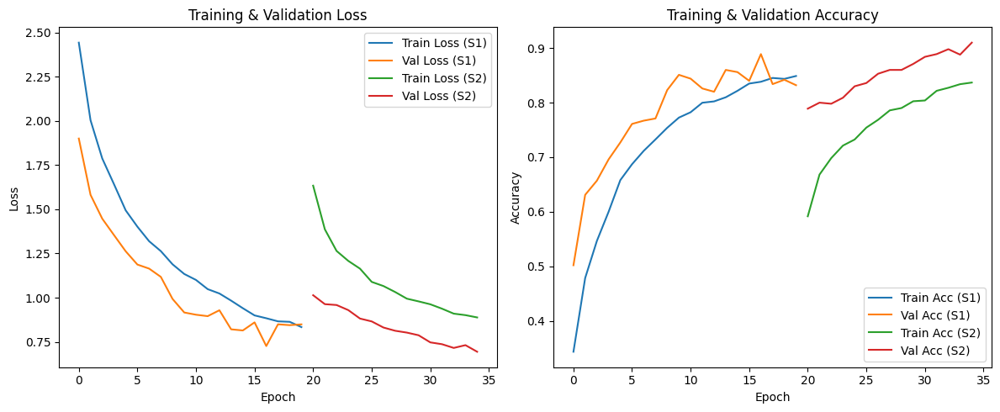


>>> Running predictions on test set...
63/63 ━━━━━━━━━━━━━━━━━━━━ 14s 140ms/step
Shapes → y_true: (2000,) | y_pred: (2000,)
First 10 true labels   : [0 0 0 0 0 0 0 0 0 0]
First 10 predicted lab : [0 1 0 1 0 0 1 0 1 0]
All elements equal?     : False

========== Overall Test Performance ==========
Overall Accuracy          : 0.9000
Balanced Accuracy         : 0.9000
Macro Precision           : 0.9069
Macro Recall (Sensitivity): 0.9000
Macro F1-score            : 0.8995
Macro Specificity         : 0.9750
Cohen's Kappa (linear)    : 0.8750
Cohen's Kappa (quadratic) : 0.9093
Matthews Corr. Coeff.     : 0.8770


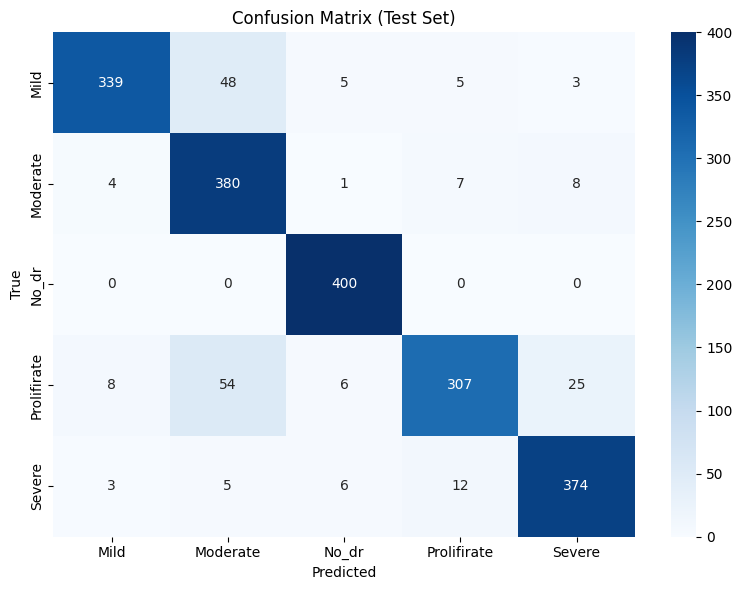


Classification Report (per class):
              precision    recall  f1-score   support

        Mild     0.9576    0.8475    0.8992       400
    Moderate     0.7803    0.9500    0.8568       400
       No_dr     0.9569    1.0000    0.9780       400
 Prolifirate     0.9275    0.7675    0.8399       400
      Severe     0.9122    0.9350    0.9235       400

    accuracy                         0.9000      2000
   macro avg     0.9069    0.9000    0.8995      2000
weighted avg     0.9069    0.9000    0.8995      2000



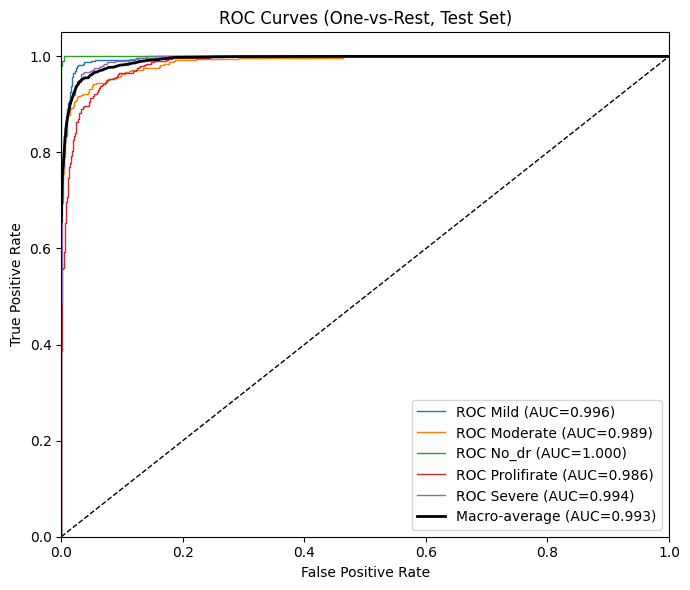

In [163]:
# ============================================
# 0. Imports & Global Config
# ============================================
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from collections import Counter

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import models
from tensorflow.keras.layers import (
    Dense, BatchNormalization, Dropout,
    GlobalAveragePooling2D
)
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.regularizers import l1

from efficientnet.tfkeras import EfficientNetB0

from sklearn.metrics import (
    classification_report, confusion_matrix, accuracy_score,
    balanced_accuracy_score, precision_score, recall_score, f1_score,
    cohen_kappa_score, matthews_corrcoef, roc_curve, auc
)

# Use GPU memory growth if needed
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for g in gpus:
            tf.config.experimental.set_memory_growth(g, True)
        print("✅ Enabled GPU memory growth.")
    except Exception as e:
        print("⚠ Could not set memory growth:", e)

# Global image size
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 42

# ============================================
# 1. Directory Paths (SET THESE!)
# ============================================
# Assumed structure:
# SPLIT_ROOT/
#   train/
#       Mild/
#       Moderate/
#       No_DR/
#       Proliferate_DR/
#       Severe/
#   val/
#       ...
#   test/
#       ...

SPLIT_ROOT = "/kaggle/working/split_dataset"  # <-- CHANGE THIS TO YOUR SPLIT ROOT

train_root_for_model = os.path.join(SPLIT_ROOT, "train")
val_root_for_model   = os.path.join(SPLIT_ROOT, "val")
test_root_for_model  = os.path.join(SPLIT_ROOT, "test")

print("Train dir:", train_root_for_model)
print("Val   dir:", val_root_for_model)
print("Test  dir:", test_root_for_model)

# ============================================
# 2. Data Generators (224×224)
# ============================================
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    zoom_range=0.1,
    horizontal_flip=True,
    width_shift_range=0.05,
    height_shift_range=0.05,
    brightness_range=[0.9, 1.1]
)

val_datagen = ImageDataGenerator(
    rescale=1./255
)

test_datagen = ImageDataGenerator(
    rescale=1./255
)

train_gen = train_datagen.flow_from_directory(
    train_root_for_model,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="sparse",
    shuffle=True,
    seed=SEED
)

val_gen = val_datagen.flow_from_directory(
    val_root_for_model,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="sparse",
    shuffle=False
)

test_gen = test_datagen.flow_from_directory(
    test_root_for_model,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="sparse",
    shuffle=False
)

class_indices = train_gen.class_indices
class_names = list(class_indices.keys())
num_classes = len(class_names)

print("\nClass indices:", class_indices)
print("Class names  :", class_names)

# ============================================
# 3. Inspect Class Balance (Train / Val / Test)
# ============================================
def count_from_generator(gen, steps):
    counts = Counter()
    for _ in range(steps):
        _, y = next(gen)
        y_int = y.astype(int)
        counts.update(y_int.tolist())
    return counts

# We need fresh generators for counting so that we don't disturb main ones
train_gen_for_count = train_datagen.flow_from_directory(
    train_root_for_model,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="sparse",
    shuffle=False
)

val_gen_for_count = val_datagen.flow_from_directory(
    val_root_for_model,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="sparse",
    shuffle=False
)

test_gen_for_count = test_datagen.flow_from_directory(
    test_root_for_model,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode="sparse",
    shuffle=False
)

train_steps = int(np.ceil(train_gen_for_count.samples / BATCH_SIZE))
val_steps   = int(np.ceil(val_gen_for_count.samples   / BATCH_SIZE))
test_steps  = int(np.ceil(test_gen_for_count.samples  / BATCH_SIZE))

train_counts = count_from_generator(train_gen_for_count, train_steps)
val_counts   = count_from_generator(val_gen_for_count,   val_steps)
test_counts  = count_from_generator(test_gen_for_count,  test_steps)

print("\nTrain class counts (by index):", train_counts)
print("Val   class counts (by index):", val_counts)
print("Test  class counts (by index):", test_counts)

# ============================================
# 4. Compute Class Weights (for imbalance)
# ============================================
total_train = sum(train_counts.values())
class_weight = {}

for cls_idx, cnt in train_counts.items():
    # inverse frequency
    class_weight[cls_idx] = total_train / (len(train_counts) * cnt)

print("\nClass weights:", class_weight)

# ============================================
# 5. Build EfficientNetB0 Model (224×224)
# ============================================
LOCAL_EFFNET_WEIGHTS = (
    "/kaggle/input/efficientnet/tensorflow2/default/1/"
    "efficientnet-b0_weights_tf_dim_ordering_tf_kernels_autoaugment_notop.h5"
)

base_model = EfficientNetB0(
    include_top=False,
    weights=LOCAL_EFFNET_WEIGHTS,   # ← use local .h5 file
    input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3)
)

base_model.trainable = False  # Start with frozen backbone

inputs = base_model.input
x = base_model.output

# Global Average Pooling + dense head
x = GlobalAveragePooling2D(name="global_avg_pool")(x)

x = Dense(128, activation='relu', kernel_regularizer=l1(1e-4))(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)

x = Dense(64, activation='relu', kernel_regularizer=l1(1e-4))(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)

x = Dense(32, activation='relu', kernel_regularizer=l1(1e-4))(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)

outputs = Dense(num_classes, activation="softmax", name="predictions")(x)

model = models.Model(inputs=inputs, outputs=outputs)
model.summary()

# ============================================
# 6. Compile & Train (Stage 1 – Frozen Backbone)
# ============================================
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=7,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    min_lr=1e-7,
    verbose=1
)

model.compile(
    optimizer=RMSprop(learning_rate=1e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

EPOCHS_STAGE1 = 20

history_stage1 = model.fit(
    train_gen,
    epochs=EPOCHS_STAGE1,
    validation_data=val_gen,
    class_weight=class_weight,
    callbacks=[early_stopping, reduce_lr]
)

# ============================================
# 7. Fine-tune last N layers of EfficientNet (Stage 2)
# ============================================
# Unfreeze last few blocks for fine-tuning
for layer in base_model.layers[-20:]:
    layer.trainable = True

model.compile(
    optimizer=RMSprop(learning_rate=1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

EPOCHS_STAGE2 = 15

history_stage2 = model.fit(
    train_gen,
    epochs=EPOCHS_STAGE2,
    validation_data=val_gen,
    class_weight=class_weight,
    callbacks=[early_stopping, reduce_lr]
)

# ============================================
# 8. Plot Training Curves
# ============================================
def plot_history(h1, h2=None):
    plt.figure(figsize=(12,5))

    # Loss
    plt.subplot(1,2,1)
    plt.plot(h1.history['loss'], label='Train Loss (S1)')
    plt.plot(h1.history['val_loss'], label='Val Loss (S1)')
    if h2 is not None:
        plt.plot([len(h1.history['loss']) + i for i in range(len(h2.history['loss']))],
                 h2.history['loss'], label='Train Loss (S2)')
        plt.plot([len(h1.history['val_loss']) + i for i in range(len(h2.history['val_loss']))],
                 h2.history['val_loss'], label='Val Loss (S2)')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training & Validation Loss')
    plt.legend()

    # Accuracy
    plt.subplot(1,2,2)
    plt.plot(h1.history['accuracy'], label='Train Acc (S1)')
    plt.plot(h1.history['val_accuracy'], label='Val Acc (S1)')
    if h2 is not None:
        plt.plot([len(h1.history['accuracy']) + i for i in range(len(h2.history['accuracy']))],
                 h2.history['accuracy'], label='Train Acc (S2)')
        plt.plot([len(h1.history['val_accuracy']) + i for i in range(len(h2.history['val_accuracy']))],
                 h2.history['val_accuracy'], label='Val Acc (S2)')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Training & Validation Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()

plot_history(history_stage1, history_stage2)

# ============================================
# 9. Evaluation on Test Set (Full Metrics)
# ============================================
print("\n>>> Running predictions on test set...")

y_pred_proba = model.predict(test_gen, verbose=1)
y_pred = np.argmax(y_pred_proba, axis=1)

# True labels from generator
y_true = test_gen.classes

print("Shapes → y_true:", y_true.shape, "| y_pred:", y_pred.shape)
print("First 10 true labels   :", y_true[:10])
print("First 10 predicted lab :", y_pred[:10])
print("All elements equal?     :", np.array_equal(y_true, y_pred))

# Basic metrics
acc = accuracy_score(y_true, y_pred)
bal_acc = balanced_accuracy_score(y_true, y_pred)
macro_prec = precision_score(y_true, y_pred, average='macro', zero_division=0)
macro_rec  = recall_score(y_true, y_pred, average='macro', zero_division=0)
macro_f1   = f1_score(y_true, y_pred, average='macro', zero_division=0)

# Specificity per class
cm = confusion_matrix(y_true, y_pred)
TN = []
FP = []
FN = []
TP = []
for i in range(num_classes):
    TP_i = cm[i,i]
    FN_i = cm[i,:].sum() - TP_i
    FP_i = cm[:,i].sum() - TP_i
    TN_i = cm.sum() - (TP_i + FN_i + FP_i)
    TP.append(TP_i)
    FN.append(FN_i)
    FP.append(FP_i)
    TN.append(TN_i)

specificity_per_class = [TN[i] / (TN[i] + FP[i] + 1e-8) for i in range(num_classes)]
macro_specificity = np.mean(specificity_per_class)

kappa_linear = cohen_kappa_score(y_true, y_pred, weights=None)
kappa_quad   = cohen_kappa_score(y_true, y_pred, weights='quadratic')
mcc          = matthews_corrcoef(y_true, y_pred)

print("\n========== Overall Test Performance ==========")
print(f"Overall Accuracy          : {acc:.4f}")
print(f"Balanced Accuracy         : {bal_acc:.4f}")
print(f"Macro Precision           : {macro_prec:.4f}")
print(f"Macro Recall (Sensitivity): {macro_rec:.4f}")
print(f"Macro F1-score            : {macro_f1:.4f}")
print(f"Macro Specificity         : {macro_specificity:.4f}")
print(f"Cohen's Kappa (linear)    : {kappa_linear:.4f}")
print(f"Cohen's Kappa (quadratic) : {kappa_quad:.4f}")
print(f"Matthews Corr. Coeff.     : {mcc:.4f}")

# ============================================
# 10. Confusion Matrix & Report
# ============================================
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names,
            yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix (Test Set)")
plt.tight_layout()
plt.show()

print("\nClassification Report (per class):")
print(classification_report(
    y_true, y_pred,
    target_names=class_names,
    digits=4
))

# ============================================
# 11. ROC Curves (One-vs-Rest, macro)
# ============================================
# Build one-hot labels for ROC
y_true_oh = tf.keras.utils.to_categorical(y_true, num_classes=num_classes)

fpr = {}
tpr = {}
roc_auc = {}

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_oh[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Macro ROC
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(num_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= num_classes
roc_auc_macro = auc(all_fpr, mean_tpr)

plt.figure(figsize=(7,6))
for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], lw=1,
             label=f"ROC {class_names[i]} (AUC={roc_auc[i]:.3f})")

plt.plot([0,1],[0,1],'k--', lw=1)
plt.plot(all_fpr, mean_tpr, 'k-', lw=2,
         label=f"Macro-average (AUC={roc_auc_macro:.3f})")
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves (One-vs-Rest, Test Set)")
plt.legend(loc="lower right"
plt.tight_layout()
plt.show()

In [170]:
model.save_weights('efficientnet_leakage_proof.weights.h5')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


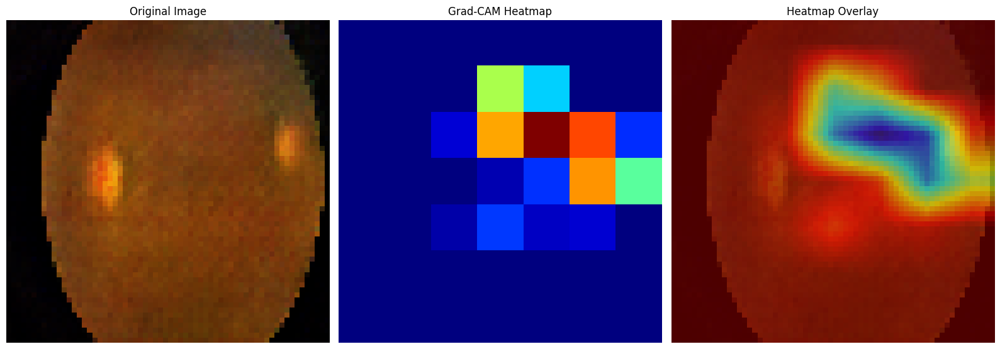

In [168]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import cv2

def generate_gradcam_heatmap(model, image, class_idx, last_conv_layer_name):
    # Build a model that maps the input image to the activations of the last conv layer and the predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(np.expand_dims(image, axis=0))
        loss = predictions[:, class_idx]
    grads = tape.gradient(loss, conv_outputs)
    guided_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(tf.multiply(guided_grads, conv_outputs), axis=-1)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def overlay_heatmap_on_image(heatmap, original_image, alpha=0.6, colormap=cv2.COLORMAP_JET):
    # Resize heatmap to match the original image size
    heatmap_resized = cv2.resize(heatmap, (original_image.shape[1], original_image.shape[0]))
    # Convert heatmap to RGB
    heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), colormap)
    # Overlay the heatmap on the original image
    overlayed_image = cv2.addWeighted(original_image, 1 - alpha, heatmap_colored, alpha, 0)
    return overlayed_image

# Ask the user to provide the image path
image_path ="/kaggle/working/split_dataset/train/Prolifirate/generated_10.png"

# Load and preprocess the image
original_image = cv2.imread(image_path)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
image = cv2.resize(original_image, (224,224)) / 255.0  # Resize and normalize

# Get the predicted class index
class_idx = np.argmax(model.predict(np.expand_dims(image, axis=0)))

# Generate the Grad-CAM heatmap
heatmap = generate_gradcam_heatmap(model, image, class_idx, last_conv_layer_name='top_conv')  # Adjust layer name

# Overlay the heatmap on the original image
overlayed_image = overlay_heatmap_on_image(heatmap, original_image)

# Plot the results
plt.figure(figsize=(16, 8))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(original_image)
plt.title("Original Image")
plt.axis("off")

# Heatmap
plt.subplot(1, 3, 2)
plt.imshow(heatmap, cmap='jet')
plt.title("Grad-CAM Heatmap")
plt.axis("off")

# Heatmap overlaid on original image
plt.subplot(1, 3, 3)
plt.imshow(overlayed_image)
plt.title("Heatmap Overlay")
plt.axis("off")

plt.tight_layout()
plt.show()


In [173]:
# --------------------------------------------------------------
# 1. Imports & helpers
# --------------------------------------------------------------
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers, callbacks
from efficientnet.tfkeras import EfficientNetB0
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Global image size
IMG_SIZE = (224, 224)

# --------------------------------------------------------------
# 2. Re-create the SAME architecture you trained
# --------------------------------------------------------------
def build_backbone_and_head(input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3),
                            weights_path=None,
                            num_classes=None):
    """
    Returns:
        model          – the full model (backbone + original head)
        conv_output    – tensor with the feature maps (for ProtoPNet)
        backbone       – only the EfficientNet part (frozen later)
    """
    efficientnet = EfficientNetB0(
        input_shape=input_shape,
        include_top=False,
        weights=weights_path  # your pre-downloaded .h5 (imagenet or local)
    )

    inputs = efficientnet.input
    conv_output = efficientnet.output                     # (B, H, W, C)

    # ---- original classification head (exactly as you trained) ----
    x = layers.GlobalAveragePooling2D()(conv_output)
    x = layers.Dense(128, kernel_regularizer=tf.keras.regularizers.l1(0.0001),
                     activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Dense(64, kernel_regularizer=tf.keras.regularizers.l1(0.0001),
                     activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Dense(32, kernel_regularizer=tf.keras.regularizers.l1(0.0001),
                     activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.3)(x)

    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)
    return model, conv_output, efficientnet

# --------------------------------------------------------------
# 3. Load the saved weights
# --------------------------------------------------------------
num_classes = 5  # <-- keep same as your current 5-class setup

# imagenet / local backbone weights (NOT your trained checkpoint)
backbone_weights_path = (
    "/kaggle/input/efficientnet/tensorflow2/default/1/"
    "efficientnet-b0_weights_tf_dim_ordering_tf_kernels_autoaugment_notop.h5"
)

full_model, conv_output, backbone = build_backbone_and_head(
    input_shape=(IMG_SIZE[0], IMG_SIZE[1], 3),
    weights_path=backbone_weights_path,
    num_classes=num_classes
)

# Load the **trained** model weights you saved for 224×224 EfficientNet
# (make sure this path points to your latest 224×224 checkpoint)
full_model.load_weights("efficientnet_leakage_proof.weights.h5")

# --------------------------------------------------------------
# 4. Freeze the backbone (EfficientNet) – we only learn prototypes
# --------------------------------------------------------------
backbone.trainable = False

# --------------------------------------------------------------
# 5. ProtoPNet layer
# --------------------------------------------------------------
class ProtoLayer(tf.keras.layers.Layer):
    """
    Prototype layer:
        - 1×1 conv projects feature map to `prototype_dim`
        - `num_prototypes` learnable prototype vectors (shape: 1×1×prototype_dim)
        - similarity = -L2 distance (higher → more similar)
    """
    def __init__(self, num_prototypes, prototype_dim=128, **kwargs):
        super().__init__(**kwargs)
        self.num_prototypes = num_prototypes
        self.prototype_dim = prototype_dim

    def build(self, input_shape):
        # 1×1 conv to project feature map
        self.proj = layers.Conv2D(
            self.prototype_dim,
            kernel_size=1,
            strides=1,
            padding='valid',
            use_bias=False,
            name='proto_projection'
        )
        # prototype vectors (learnable)
        w_init = tf.random_normal_initializer()
        self.prototypes = self.add_weight(
            shape=(1, 1, self.num_prototypes, self.prototype_dim),
            initializer=w_init,
            trainable=True,
            name='prototypes'
        )
        super().build(input_shape)

    def call(self, feature_map):
        """
        feature_map : (B, H, W, C)
        Returns:
            similarity_map : (B, H, W, num_prototypes)
        """
        # (B, H, W, prototype_dim)
        projected = self.proj(feature_map)

        # expand prototypes for broadcasting
        prot = self.prototypes               # (1,1,P,D)

        # L2 distance per location
        dist = tf.reduce_sum(tf.square(projected[:, :, :, tf.newaxis, :] - prot), axis=-1)
        # similarity = -distance  (higher = more similar)
        similarity = -dist                     # (B, H, W, P)
        return similarity

    def get_config(self):
        config = super().get_config()
        config.update({
            "num_prototypes": self.num_prototypes,
            "prototype_dim": self.prototype_dim
        })
        return config

# --------------------------------------------------------------
# 6. Build the ProtoPNet model (backbone + prototype layer + classifier)
# --------------------------------------------------------------
num_prototypes = 10 * num_classes   # e.g. 10 prototypes per class
prototype_dim = 128                 # can keep this as before

inputs = backbone.input
feature_maps = backbone.output                     # (B, H, W, C)

# prototype branch
proto_similarity = ProtoLayer(num_prototypes, prototype_dim)(feature_maps)  # (B,H,W,P)

# Global max pooling over spatial dims → one similarity score per prototype
proto_scores = layers.GlobalMaxPooling2D()(proto_similarity)   # (B, P)

# small classifier on top of prototype scores
proto_head = layers.Dense(256, activation='relu')(proto_scores)
proto_head = layers.Dropout(0.3)(proto_head)
proto_outputs = layers.Dense(num_classes, activation='softmax',
                             name='proto_logits')(proto_head)

proto_model = models.Model(inputs, proto_outputs)

# --------------------------------------------------------------
# 7. Compile (only prototype-related weights are trainable)
# --------------------------------------------------------------
proto_model.compile(
    optimizer=optimizers.Adam(learning_rate=1e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# --------------------------------------------------------------
# 8. (Optional) Train the prototype layer on your data
#     (for 224×224 you’ll typically train using generators instead of X_train)
# --------------------------------------------------------------
# Example with numpy arrays (if you have them):
# early_stop = callbacks.EarlyStopping(
#     monitor='val_accuracy',
#     patience=7,
#     restore_best_weights=True
# )
# proto_model.fit(
#     X_train_224, y_train,
#     validation_data=(X_val_224, y_val),
#     epochs=50,
#     batch_size=32,
#     callbacks=[early_stop]
# )

# --------------------------------------------------------------
# 9. Function: get prototype activations for any two images
#     (now auto-resizes to 224×224)
# --------------------------------------------------------------
def get_prototype_activations(model, img1, img2):
    """
    img1, img2 : any image (H,W,C) or (H,W)
    Returns:
        sim1, sim2 : (H_model, W_model, num_prototypes) similarity maps
        scores1, scores2 : (num_prototypes,) global max similarity per prototype
    """
    from skimage.transform import resize

    def _to_rgb(arr):
        arr = np.asarray(arr)
        if arr.ndim == 2:                     # grayscale → 3-channel
            arr = np.stack([arr] * 3, axis=-1)
        if arr.shape[-1] == 4:                # drop alpha
            arr = arr[..., :3]
        if arr.shape[-1] != 3:
            raise ValueError(f"Cannot convert to RGB, shape {arr.shape}")
        return arr

    img1 = _to_rgb(img1)
    img2 = _to_rgb(img2)

    # ---- resize to model input size (224×224) ----
    if img1.shape[:2] != IMG_SIZE:
        img1 = resize(img1, IMG_SIZE, anti_aliasing=True)
    if img2.shape[:2] != IMG_SIZE:
        img2 = resize(img2, IMG_SIZE, anti_aliasing=True)

    # ---- normalize to [0,1] ----
    imgs = np.stack([img1, img2], axis=0).astype('float32')
    if imgs.max() > 1.0:
        imgs /= 255.0

    # ---- intermediate model up to ProtoLayer ----
    proto_layer = next(l for l in model.layers if isinstance(l, ProtoLayer))
    intermediate = models.Model(model.input, proto_layer.output)

    # ---- predict similarity maps ----
    similarity_maps = intermediate.predict(imgs, verbose=0)   # (2, H, W, P)

    # ---- global max per prototype ----
    global_scores = np.max(np.max(similarity_maps, axis=2), axis=1)   # (2, P)

    return similarity_maps[0], similarity_maps[1], global_scores[0], global_scores[1]

# --------------------------------------------------------------
# 10. Visualise prototypes for two example images (224-aware)
# --------------------------------------------------------------
def visualise_prototypes(img1, img2, sim_map1, sim_map2,
                         top_k=5, figsize=(15, 8)):
    """
    img1, img2 : original (possibly high-res) images – any channel count
    sim_map1/2 : similarity maps from the model (H_model, W_model, P)
    """
    from skimage.transform import resize

    # ---------- helper: convert any image to RGB in [0,1] ----------
    def _prepare_img(img):
        img = np.asarray(img)
        if img.ndim == 2:                     # grayscale
            img = np.stack([img] * 3, axis=-1)
        if img.shape[-1] == 4:                # drop alpha
            img = img[..., :3]
        if img.max() > 1.0:
            img = img / 255.0
        return img.astype('float32')

    img1 = _prepare_img(img1)      # (H1, W1, 3) in [0,1]
    img2 = _prepare_img(img2)      # (H2, W2, 3) in [0,1]

    # ---------- overlay heatmap on *original* resolution ----------
    def overlay_heatmap(orig_img, heatmap):
        # heatmap: (H_model, W_model)
        # resize to original image size
        heatmap_resized = resize(
            heatmap,
            orig_img.shape[:2],
            anti_aliasing=True,
            order=1,
            preserve_range=True
        )
        # normalise to [0,1]
        h = heatmap_resized
        h = (h - h.min()) / (h.ptp() + 1e-8)

        cmap = plt.cm.jet
        colored = cmap(h)[..., :3]                 # (H, W, 3)
        overlaid = 0.6 * orig_img + 0.4 * colored
        return np.clip(overlaid, 0, 1)

    # ---------- find globally top-k prototypes ----------
    all_max = np.concatenate([
        np.max(sim_map1, axis=(0, 1)),
        np.max(sim_map2, axis=(0, 1))
    ])
    top_idx = np.argsort(-all_max)[:top_k]

    # ---------- plotting ----------
    plt.figure(figsize=figsize)
    for i, p_idx in enumerate(top_idx):
        # ---- image 1 ----
        ax = plt.subplot(2, top_k, i + 1)
        heat1 = sim_map1[..., p_idx]                # (H_model, W_model)
        ov1 = overlay_heatmap(img1, heat1)
        ax.imshow(ov1)
        ax.set_title(f'Img1 Proto {p_idx}\nmax={np.max(heat1):.2f}')
        ax.axis('off')

        # ---- image 2 ----
        ax = plt.subplot(2, top_k, i + 1 + top_k)
        heat2 = sim_map2[..., p_idx]
        ov2 = overlay_heatmap(img2, heat2)
        ax.imshow(ov2)
        ax.set_title(f'Img2 Proto {p_idx}\nmax={np.max(heat2):.2f}')
        ax.axis('off')

    plt.tight_layout()
    plt.show()

In [180]:
def visualise_prototypes(img1, img2, sim_map1, sim_map2,
                         top_k=5, figsize=(15, 8)):
    """
    Visualise prototypes + draw bounding box around bluish (low activation)
    region using ONLY NumPy (NO scipy, NO skimage.measure).

    img1, img2     : original images (any size, any channels 1/3/4)
    sim_map1/2     : similarity maps from ProtoLayer, shape (H_model, W_model, P)
    top_k          : number of prototypes to display across the two images
    """

    import numpy as np
    import matplotlib.pyplot as plt
    import matplotlib.patches as patches
    from skimage.transform import resize   # only resize, safe

    # ---------- helper: convert any image to RGB in [0,1] ----------
    def _prepare_img(img):
        img = np.asarray(img)
        if img.ndim == 2:          # grayscale → 3-channel
            img = np.stack([img] * 3, axis=-1)
        if img.shape[-1] == 4:     # drop alpha
            img = img[..., :3]
        if img.max() > 1.0:
            img = img / 255.0
        return img.astype('float32')

    img1 = _prepare_img(img1)   # (H1, W1, 3)
    img2 = _prepare_img(img2)   # (H2, W2, 3)

    # ---------- overlay heatmap onto original resolution ----------
    def overlay_heatmap(orig_img, heatmap):
        """
        orig_img : (H_orig, W_orig, 3)
        heatmap  : (H_model, W_model)
        returns:
            overlaid   : RGB float image in [0,1]
            heat_norm  : resized + normalised heatmap in [0,1]
        """
        heat_resized = resize(
            heatmap,
            orig_img.shape[:2],
            anti_aliasing=True,
            order=1,
            preserve_range=True
        )

        h = heat_resized
        h = (h - h.min()) / (h.ptp() + 1e-8)

        cmap = plt.cm.jet
        colored = cmap(h)[..., :3]                # (H, W, 3)
        overlaid = 0.6 * orig_img + 0.4 * colored
        return np.clip(overlaid, 0, 1), h

    # ---------- find top-k prototypes by global max activation ----------
    all_max = np.concatenate([
        np.max(sim_map1, axis=(0, 1)),
        np.max(sim_map2, axis=(0, 1))
    ])
    top_idx = np.argsort(-all_max)[:top_k]

    # ===========================================================
    # PURE NUMPY CONNECTED COMPONENT LABELING (NO SCIPY/SKIMAGE)
    # ===========================================================
    def ccl_numpy(binary_mask):
        """
        Connected component labeling using pure NumPy (4-connected).
        Returns list of bounding boxes (minr, minc, maxr, maxc).
        """
        H, W = binary_mask.shape
        labels = np.zeros((H, W), dtype=np.int32)
        label_id = 1
        bboxes = []

        for r in range(H):
            for c in range(W):
                if binary_mask[r, c] and labels[r, c] == 0:
                    # start new component
                    stack = [(r, c)]
                    labels[r, c] = label_id

                    minr = maxr = r
                    minc = maxc = c

                    while stack:
                        y, x = stack.pop()

                        # update bbox
                        if y < minr: minr = y
                        if y > maxr: maxr = y
                        if x < minc: minc = x
                        if x > maxc: maxc = x

                        # 4 neighbours
                        for ny, nx in [(y-1, x), (y+1, x), (y, x-1), (y, x+1)]:
                            if 0 <= ny < H and 0 <= nx < W:
                                if binary_mask[ny, nx] and labels[ny, nx] == 0:
                                    labels[ny, nx] = label_id
                                    stack.append((ny, nx))

                    bboxes.append((minr, minc, maxr, maxc))
                    label_id += 1

        return bboxes

    # ---------- choose largest low-activation (“blue”) region ----------
    def get_blue_box(heat_norm, thresh=0.25):
        """
        heat_norm : heatmap in [0,1] (higher = more activation)
        We treat values < thresh as 'blue' (low activation).
        """
        blue_mask = heat_norm < thresh
        bboxes = ccl_numpy(blue_mask)
        if not bboxes:
            return None

        # pick largest area component
        areas = [(br[2] - br[0]) * (br[3] - br[1]) for br in bboxes]
        return bboxes[np.argmax(areas)]

    # ---------- plotting ----------
    plt.figure(figsize=figsize)

    for i, p_idx in enumerate(top_idx):
        # ==================== IMAGE 1 ====================
        heat1 = sim_map1[..., p_idx]
        ov1, heat1_norm = overlay_heatmap(img1, heat1)

        ax = plt.subplot(2, top_k, i + 1)
        ax.imshow(ov1)
        ax.set_title(f"Img1 Proto {p_idx}")
        ax.axis("off")

        bbox1 = get_blue_box(heat1_norm)
        if bbox1 is not None:
            minr, minc, maxr, maxc = bbox1
            rect1 = patches.Rectangle(
                (minc, minr),
                maxc - minc,
                maxr - minr,
                linewidth=2,
                edgecolor='cyan',
                facecolor='none'
            )
            ax.add_patch(rect1)

        # ==================== IMAGE 2 ====================
        heat2 = sim_map2[..., p_idx]
        ov2, heat2_norm = overlay_heatmap(img2, heat2)

        ax = plt.subplot(2, top_k, i + 1 + top_k)
        ax.imshow(ov2)
        ax.set_title(f"Img2 Proto {p_idx}")
        ax.axis("off")

        bbox2 = get_blue_box(heat2_norm)
        if bbox2 is not None:
            minr, minc, maxr, maxc = bbox2
            rect2 = patches.Rectangle(
                (minc, minr),
                maxc - minc,
                maxr - minr,
                linewidth=2,
                edgecolor='cyan',
                facecolor='none'
            )
            ax.add_patch(rect2)

    plt.tight_layout()
    plt.show()

Top-3 prototype scores for image 1: [-9.164054 -9.203403 -9.300637]
Top-3 prototype scores for image 2: [-10.475261 -10.602327 -10.670689]


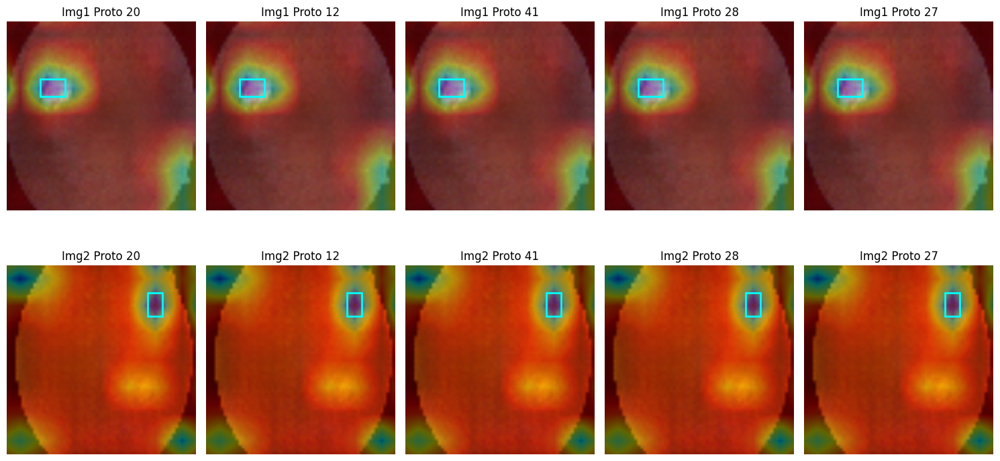

In [181]:
# --------------------------------------------------------------
# Example usage (replace with your own images)
# --------------------------------------------------------------
#if __name__ == "__main__":
    # ---- load two arbitrary images (100×100×3) ----
from skimage.io import imread
from skimage.transform import resize

img_path1 = '/kaggle/input/created-dataset-db/No_dr/generated_1.png'   # <-- replace
img_path2 = '/kaggle/input/created-dataset-db/Moderate/generated_100.png'   # <-- replace

img1 = imread(img_path1)
img2 = imread(img_path2)

img1 = resize(img1, (224,224), anti_aliasing=True)
img2 = resize(img2, (224,224), anti_aliasing=True)

sim1, sim2, scores1, scores2 = get_prototype_activations(proto_model, img1, img2)

print("Top-3 prototype scores for image 1:", scores1[np.argsort(-scores1)[:3]])
print("Top-3 prototype scores for image 2:", scores2[np.argsort(-scores2)[:3]])

visualise_prototypes(img1, img2, sim1, sim2, top_k=5)


===== Processing class: No_DR =====


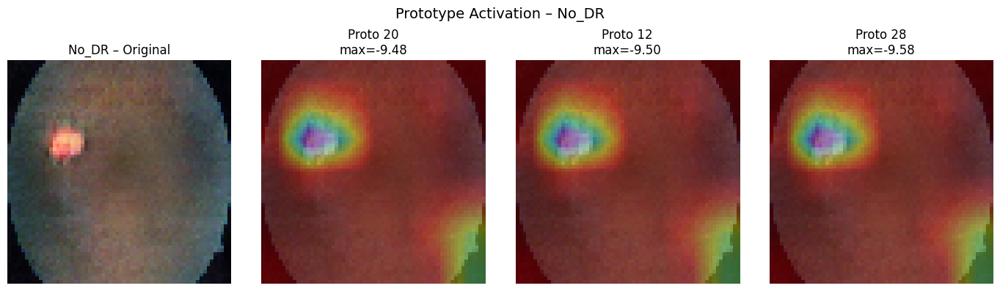

✅ Saved: /kaggle/working/ch5_prototypes_all_classes/proto_activation_No_DR.png

===== Processing class: Mild_DR =====


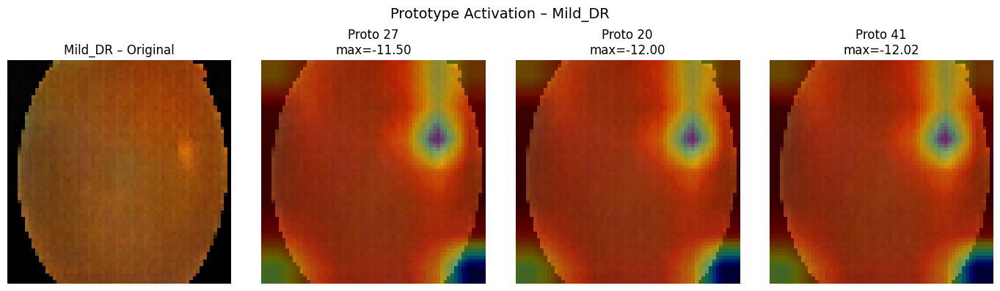

✅ Saved: /kaggle/working/ch5_prototypes_all_classes/proto_activation_Mild_DR.png

===== Processing class: Moderate_DR =====


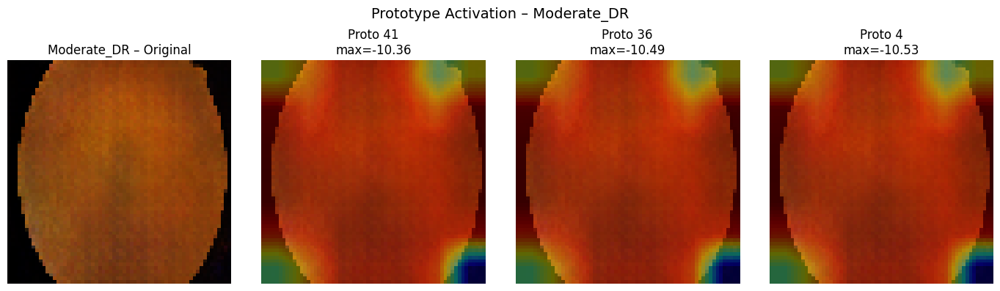

✅ Saved: /kaggle/working/ch5_prototypes_all_classes/proto_activation_Moderate_DR.png

===== Processing class: Severe_DR =====


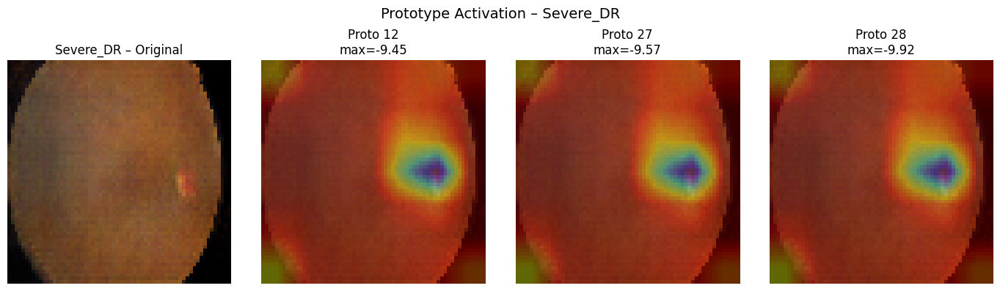

✅ Saved: /kaggle/working/ch5_prototypes_all_classes/proto_activation_Severe_DR.png

===== Processing class: Proliferate_DR =====


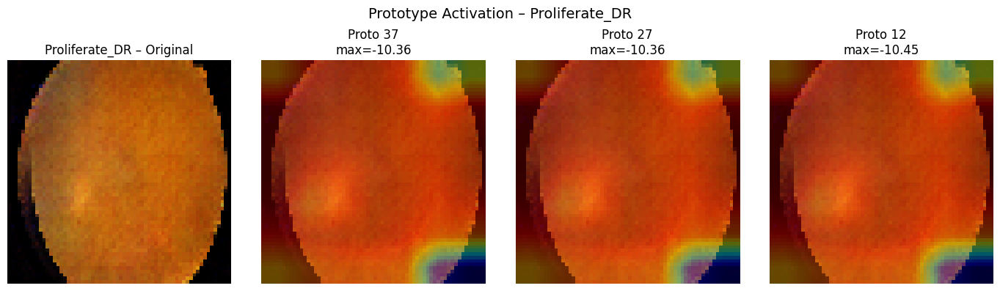

✅ Saved: /kaggle/working/ch5_prototypes_all_classes/proto_activation_Proliferate_DR.png


In [174]:
# --------------------------------------------------------------
# Generate prototype activation maps for ALL DR categories
# --------------------------------------------------------------

# One representative image per class (edit filenames if needed)
class_image_paths = {
    "No_DR"        : "/kaggle/input/created-dataset-db/No_dr/generated_1.png",
    "Mild_DR"      : "/kaggle/input/created-dataset-db/Mild/generated_1.png",
    "Moderate_DR"  : "/kaggle/input/created-dataset-db/Moderate/generated_1.png",
    "Severe_DR"    : "/kaggle/input/created-dataset-db/Severe/generated_1.png",
    "Proliferate_DR": "/kaggle/input/created-dataset-db/Prolifirate/generated_1.png",
}

output_dir = "/kaggle/working/ch5_prototypes_all_classes"
os.makedirs(output_dir, exist_ok=True)

for class_name, img_path in class_image_paths.items():
    print(f"\n===== Processing class: {class_name} =====")
    sim_map, scores, orig_rgb, _ = get_prototype_activations_single(
        proto_model,
        image_path=img_path,
        input_size=(224, 224)     # must match your proto_model input
    )

    # you can tweak top_k (e.g., 3 or 5) depending on what you want for the thesis
    plot_prototype_activation_for_image(
        orig_rgb=orig_rgb,
        sim_map=sim_map,
        scores=scores,
        class_name=class_name,
        top_k=3,
        out_dir=output_dir
    )

In [175]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
from tensorflow.keras import models

# ------------------------------------------
# Find ProtoLayer once (global)
# ------------------------------------------
proto_layer = None
for layer in proto_model.layers:
    if isinstance(layer, ProtoLayer):
        proto_layer = layer
        break

if proto_layer is None:
    raise ValueError("No ProtoLayer found inside proto_model.")

# Intermediate model: input → ProtoLayer output
proto_intermediate_model = models.Model(proto_model.input, proto_layer.output)


def get_proto_sim_from_array(img_224x224):
    """
    img_100x100 : numpy array (224,224,3), scaled to [0,1]

    Returns:
        sim_map  : (H_model, W_model, P) similarity maps
        scores   : (P,) global max similarity per prototype
    """
    img = img_224x224.astype("float32")
    if img.max() > 1.0:
        img /= 255.0

    sim_map = proto_intermediate_model.predict(
        img[np.newaxis, ...],
        verbose=0
    )[0]   # (H_model, W_model, P)

    scores = np.max(sim_map, axis=(0, 1))  # (P,)
    return sim_map, scores

In [176]:
def plot_proto_overlay_for_test_image(img_224x224,
                                      sim_map,
                                      scores,
                                      class_name,
                                      top_k=3,
                                      out_dir="/kaggle/working/ch5_correct_proto",
                                      figsize=(14, 4)):
    """
    Creates a figure:
      - Original test image
      - Top-k prototype activation overlays

    Saves as:
      out_dir/proto_overlay_test_<class_name>.png
    """
    os.makedirs(out_dir, exist_ok=True)

    img = img_224x224.astype("float32")
    if img.max() > 1.0:
        img /= 255.0
    img_vis = img[..., ::-1] 
    # Top-k prototype indices
    top_idx = np.argsort(-scores)[:top_k]

    plt.figure(figsize=figsize)

    # Original image
    ax = plt.subplot(1, top_k + 1, 1)
    ax.imshow(img_vis)
    ax.set_title(f"{class_name} – Test Image")
    ax.axis("off")
    Hm, Wm, P = sim_map.shape
    for i, p_idx in enumerate(top_idx, start=2):
        heat = sim_map[..., p_idx]

        # Normalise heatmap
        h = (heat - heat.min()) / (heat.ptp() + 1e-8)
        # Resize to 100x100 (same as input)
        h_resized = cv2.resize(h, (img.shape[1], img.shape[0]))
        h_resized = (h_resized - h_resized.min()) / (h_resized.ptp() + 1e-8)

        cmap = plt.cm.jet
        coloured = cmap(h_resized)[..., :3]
        overlay = 0.6 * img_vis + 0.4 * coloured
        overlay = np.clip(overlay, 0, 1)

        ax = plt.subplot(1, top_k + 1, i)
        ax.imshow(overlay)
        ax.set_title(f"Proto {p_idx}\nmax={np.max(heat):.2f}")
        ax.axis("off")

    plt.suptitle(f"Prototype Activation – Correct {class_name} Test Case", fontsize=14)
    fname = os.path.join(out_dir, f"proto_overlay_test_{class_name}.png")
    plt.tight_layout()
    plt.subplots_adjust(top=0.80)
    plt.savefig(fname, dpi=300, bbox_inches="tight")
    plt.show()

    print(f"✅ Saved: {fname}")

Example indices per class: {0: 1, 1: 2, 2: 0, 3: 3, 4: 6}


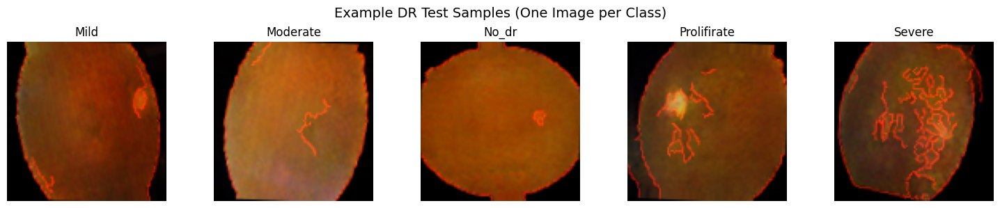

In [183]:
import numpy as np
import matplotlib.pyplot as plt
import cv2   # <-- needed for BGR → RGB

# ---------------------------------------------
# Assumptions
# X_test: (N,224,224,3) in [0,1] or [0,255], but channels in BGR order
# y_test: (N,)
# class_names = ['No_DR','Mild_DR','Moderate_DR','Severe_DR','Proliferate_DR']
# ---------------------------------------------

num_classes = len(class_names)

# Find ONE valid example per class
example_indices = {}

for c in range(num_classes):
    idx = np.where(y_test == c)[0]
    if len(idx) > 0:
        example_indices[c] = idx[0]
    else:
        print(f"⚠ No sample found for class {class_names[c]} in test set.")

print("Example indices per class:", example_indices)

# ---------------------------------------------
# Plot one image per class (with BGR → RGB fix)
# ---------------------------------------------
plt.figure(figsize=(15, 3))

for i, (c, idx) in enumerate(example_indices.items(), start=1):
    ax = plt.subplot(1, len(example_indices), i)

    img = X_test[idx]  # (224,224,3), currently BGR

    # Scale to uint8 for cv2 / matplotlib
    if img.max() <= 1.0:
        img_vis = (img * 255).astype("uint8")
    else:
        img_vis = img.astype("uint8")

    # 🔵➡️ Proper fix: convert BGR → RGB
    img_rgb = cv2.cvtColor(img_vis, cv2.COLOR_BGR2RGB)

    ax.imshow(img_rgb)
    ax.set_title(class_names[c], fontsize=12)
    ax.axis("off")

plt.suptitle("Example DR Test Samples (One Image per Class)", fontsize=14)
plt.tight_layout()
plt.show()

In [187]:
import os
import cv2
import numpy as np

# ------------------------------------------
# 1. Get predictions on the test set (Proto model)
# ------------------------------------------
y_pred_probs = proto_model.predict(X_test, verbose=0)
y_pred = np.argmax(y_pred_probs, axis=1)

# ------------------------------------------
# 2. For each class, pick one correctly classified index
# ------------------------------------------
correct_indices_by_class = {}

for c in range(num_classes):
    correct_idx = np.where((y_test == c) & (y_pred == c))[0]
    if len(correct_idx) > 0:
        correct_indices_by_class[c] = correct_idx[0]

print("Correctly classified index per class:", correct_indices_by_class)

# ------------------------------------------
# 3. Generate prototype overlay images for these cases
#    (fixed for 224×224 and non-bluish RGB display)
# ------------------------------------------
out_dir = "/kaggle/working/ch5_correct_proto"
os.makedirs(out_dir, exist_ok=True)

for c, idx in correct_indices_by_class.items():
    class_name = class_names[c]
    print(f"\n===== {class_name} – test index {idx} =====")

    # -------------------------------------------------
    # X_test[idx] is assumed to be (224,224,3) in BGR
    # and either [0,1] or [0,255]. We:
    #   1) convert to uint8
    #   2) convert BGR → RGB
    #   3) normalise to [0,1] float32
    # -------------------------------------------------
    raw = X_test[idx]  # (224,224,3)

    if raw.max() <= 1.0:
        img_uint8 = (raw * 255).astype("uint8")
    else:
        img_uint8 = raw.astype("uint8")

    # 🔵 Fix bluish tint: convert BGR → RGB
    img_rgb = cv2.cvtColor(img_uint8, cv2.COLOR_BGR2RGB)

    # Final image for the proto model: RGB in [0,1]
    img = img_rgb.astype("float32") / 255.0   # (224,224,3), RGB, [0,1]

    # ----------------------------------------------
    # Get prototype similarity for this image
    # (get_proto_sim_from_array should NOT resize again
    #  if you’ve already adapted it for 224×224)
    # ----------------------------------------------
    sim_map, scores = get_proto_sim_from_array(img)

    # ----------------------------------------------
    # Plot + save figure with overlayed prototypes
    # (parameter name img_100x100 is just historical;
    #  it now holds a 224×224 RGB image)
    # ----------------------------------------------
    plot_proto_overlay_for_test_image(
        img_100x100=img,      # 224×224 RGB, [0,1]
        sim_map=sim_map,
        scores=scores,
        class_name=class_name,
        top_k=3,
        out_dir=out_dir
    )

ValueError: Input 0 of layer "functional_71" is incompatible with the layer: expected shape=(None, 224, 224, 3), found shape=(32, 100, 100, 3)

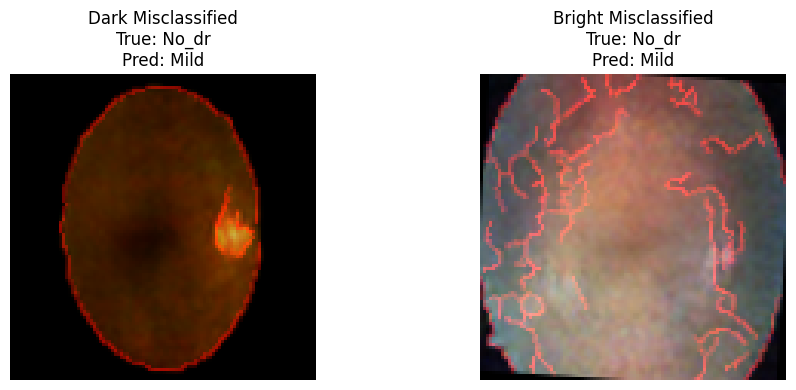

In [184]:
plt.figure(figsize=(10,4))

# --- Dark image ---
ax = plt.subplot(1,2,1)
img_dark = X_test[dark_idx].astype("float32")
if img_dark.max() > 1.0:
    img_dark /= 255.0

# 🔥 Fix tint: convert BGR → RGB
img_dark_vis = img_dark[..., ::-1]

ax.imshow(img_dark_vis)
ax.set_title(f"Dark Misclassified\nTrue: {class_names[y_test[dark_idx]]}\nPred: {class_names[y_pred[dark_idx]]}")
ax.axis("off")

# --- Bright image ---
ax = plt.subplot(1,2,2)
img_bright = X_test[bright_idx].astype("float32")
if img_bright.max() > 1.0:
    img_bright /= 255.0

# 🔥 Fix tint: convert BGR → RGB
img_bright_vis = img_bright[..., ::-1]

ax.imshow(img_bright_vis)
ax.set_title(f"Bright Misclassified\nTrue: {class_names[y_test[bright_idx]]}\nPred: {class_names[y_pred[bright_idx]]}")
ax.axis("off")

plt.tight_layout()
plt.show()

In [185]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import models

# ---- 1. locate ProtoLayer inside proto_model ----
proto_layer = None
for layer in proto_model.layers:
    # works whether you named it explicitly or not
    if layer.__class__.__name__ == "ProtoLayer":
        proto_layer = layer
        break

if proto_layer is None:
    raise ValueError("❌ Could not find ProtoLayer in proto_model.layers")

print("✅ Found ProtoLayer:", proto_layer.name)

# ---- 2. intermediate model: input -> similarity maps from ProtoLayer ----
proto_sim_model = models.Model(
    inputs=proto_model.input,
    outputs=proto_layer.output   # (B, H, W, num_prototypes)
)

print("Intermediate proto_sim_model ready. Output shape:", proto_sim_model.output_shape)

✅ Found ProtoLayer: proto_layer_4
Intermediate proto_sim_model ready. Output shape: (None, 7, 7, 50)


Base prob for true class No_dr: 0.0000


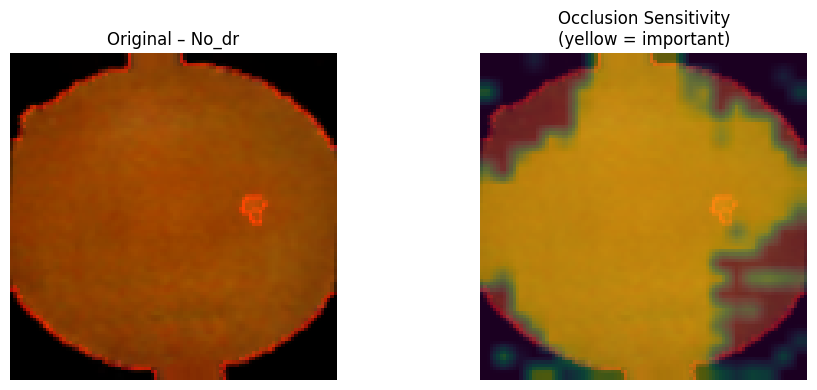

In [188]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

def occlusion_sensitivity(proto_model, img_any, true_class_idx,
                          patch_size=20, stride=10, baseline_value=0.0):
    """
    Generic occlusion sensitivity for proto_model.

    proto_model      : your trained prototype model
    img_any          : image as (H, W, 3) in [0,1] or [0,255] (BGR or RGB)
    true_class_idx   : integer label (0..num_classes-1)
    patch_size       : size of occlusion square (in model input pixels)
    stride           : stride of the sliding occlusion window
    baseline_value   : value to fill in occluded patch (0.0 -> black)

    Returns:
        heatmap   : (H_occl, W_occl) – confidence drop per occluded patch
        base_prob : model's base probability for true class (without occlusion)
    """
    # ----------------------------------------------------
    # 1) Normalise to float32 [0,1]
    # ----------------------------------------------------
    img = img_any.astype("float32")
    if img.max() > 1.0:
        img = img / 255.0

    # ----------------------------------------------------
    # 2) Resize to model's expected input size
    # ----------------------------------------------------
    # proto_model.input_shape is (None, H_model, W_model, 3)
    _, H_model, W_model, _ = proto_model.input_shape

    if img.shape[0] != H_model or img.shape[1] != W_model:
        img_model = cv2.resize(img, (W_model, H_model))  # (W,H)!
    else:
        img_model = img.copy()

    # ----------------------------------------------------
    # 3) Base confidence for the true class
    # ----------------------------------------------------
    base_prob = proto_model.predict(img_model[np.newaxis, ...], verbose=0)[0, true_class_idx]

    # ----------------------------------------------------
    # 4) Sliding occlusion
    # ----------------------------------------------------
    H, W, _ = img_model.shape

    hs = list(range(0, H - patch_size + 1, stride))
    ws = list(range(0, W - patch_size + 1, stride))

    heatmap = np.zeros((len(hs), len(ws)), dtype="float32")

    for i, y in enumerate(hs):
        for j, x in enumerate(ws):
            occluded = img_model.copy()
            occluded[y:y+patch_size, x:x+patch_size, :] = baseline_value

            prob = proto_model.predict(occluded[np.newaxis, ...], verbose=0)[0, true_class_idx]
            drop = base_prob - prob
            heatmap[i, j] = max(drop, 0.0)

    return heatmap, base_prob


def plot_occlusion_map(img_any, heatmap, class_name,
                       figsize=(10, 4)):
    """
    Visualise occlusion sensitivity:
    - left  : original image
    - right : heatmap overlay (yellow/red = important)
    """
    img = img_any.astype("float32")
    if img.max() > 1.0:
        img = img / 255.0

    # 🔵 If your X_test is BGR (e.g. loaded via cv2), convert to RGB for display
    img_vis = img[..., ::-1]

    # Upscale heatmap to match original image resolution
    H_img, W_img, _ = img_vis.shape
    up = cv2.resize(heatmap, (W_img, H_img))
    up = (up - up.min()) / (up.ptp() + 1e-8)

    cmap = plt.cm.viridis
    coloured = cmap(up)[..., :3]

    overlay = 0.6 * img_vis + 0.4 * coloured
    overlay = np.clip(overlay, 0, 1)

    plt.figure(figsize=figsize)

    # --- Original image ---
    plt.subplot(1, 2, 1)
    plt.imshow(img_vis)
    plt.title(f"Original – {class_name}")
    plt.axis("off")

    # --- Occlusion Map ---
    plt.subplot(1, 2, 2)
    plt.imshow(overlay)
    plt.title("Occlusion Sensitivity\n(yellow = important)")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


# ---------- Example usage on one test sample ----------
idx = 0  # pick any test index
img = X_test[idx]             # (100×100×3 or 224×224×3, BGR or RGB)
true_label = int(y_test[idx])

heatmap_occ, base_prob = occlusion_sensitivity(
    proto_model,
    img,
    true_class_idx=true_label,
    patch_size=20,    # for 224×224, a bit larger patch makes sense
    stride=10
)

print(f"Base prob for true class {class_names[true_label]}: {base_prob:.4f}")
plot_occlusion_map(img, heatmap_occ, class_names[true_label])

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_2983']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


Stability correlations vs base heatmap: [ 0.  0. -0.  0.  0.]
Mean stability: 7.043773e-05


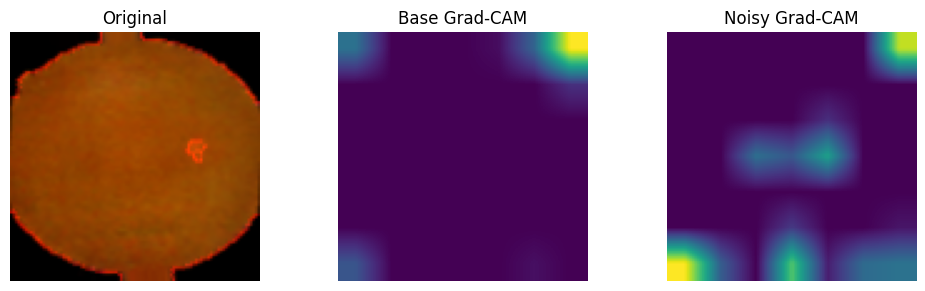

In [190]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf

# ------------------------------------------------
# 1. Grad-CAM heatmap generator
# ------------------------------------------------
def generate_gradcam_heatmap(model, image_model_resized, class_idx,
                             last_conv_layer_name='top_conv'):
    """
    model                 : Keras model
    image_model_resized   : (H_model, W_model, 3) float32 in [0,1]
    class_idx             : target class index
    last_conv_layer_name  : name of last conv layer (e.g. 'top_conv' for EfficientNetB0)

    Returns:
        heatmap: (H_feature, W_feature) in [0,1]
    """
    grad_model = tf.keras.models.Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, preds = grad_model(image_model_resized[np.newaxis, ...])
        loss = preds[:, class_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    heatmap = tf.reduce_sum(pooled_grads * conv_outputs, axis=-1)
    heatmap = tf.maximum(heatmap, 0) / (tf.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy()   # (H_feat, W_feat)


# ------------------------------------------------
# 2. Grad-CAM stability under perturbations
# ------------------------------------------------
def gradcam_stability(proto_model,
                      img_any,
                      true_class_idx,
                      last_conv_layer_name='top_conv',
                      n_perturb=5,
                      noise_std=0.02):
    """
    proto_model : your trained prototype model
    img_any     : original image (H, W, 3) in [0,1] or [0,255], BGR or RGB
    true_class_idx: integer label
    Returns:
        base_hm         : base Grad-CAM heatmap (H_feat, W_feat)
        heatmaps_noisy  : list of Grad-CAM heatmaps for noisy variants
        stability_scores: list of correlation values vs base_hm
    """

    # -------- 1) Normalise original image to [0,1] --------
    img = img_any.astype("float32")
    if img.max() > 1.0:
        img /= 255.0

    # -------- 2) Resize to model input size --------
    # proto_model.input_shape = (None, H_model, W_model, 3)
    _, H_model, W_model, _ = proto_model.input_shape

    if img.shape[0] != H_model or img.shape[1] != W_model:
        img_model = cv2.resize(img, (W_model, H_model))  # (W,H)
    else:
        img_model = img.copy()

    # -------- 3) Base Grad-CAM --------
    base_hm = generate_gradcam_heatmap(
        proto_model,
        img_model,
        class_idx=true_class_idx,
        last_conv_layer_name=last_conv_layer_name
    )

    # Flatten + normalise for correlation
    base_flat = base_hm.reshape(-1)
    base_flat = (base_flat - base_flat.mean()) / (base_flat.std() + 1e-8)

    heatmaps_noisy = []
    stability_scores = []

    # -------- 4) Perturbations --------
    for _ in range(n_perturb):
        noisy = img_model + np.random.normal(0, noise_std, img_model.shape)
        noisy = np.clip(noisy, 0, 1)

        hm_noisy = generate_gradcam_heatmap(
            proto_model,
            noisy,
            class_idx=true_class_idx,
            last_conv_layer_name=last_conv_layer_name
        )
        heatmaps_noisy.append(hm_noisy)

        hm_flat = hm_noisy.reshape(-1)
        hm_flat = (hm_flat - hm_flat.mean()) / (hm_flat.std() + 1e-8)
        corr = np.mean(base_flat * hm_flat)    # cosine-like correlation
        stability_scores.append(corr)

    return base_hm, heatmaps_noisy, stability_scores


# ------------------------------------------------
# 3. Example usage
# ------------------------------------------------
idx = 0
img = X_test[idx]          # original test image (likely 224×224×3 now)
true_label = int(y_test[idx])

base_hm, noisy_hms, stab_scores = gradcam_stability(
    proto_model,
    img,
    true_class_idx=true_label,
    last_conv_layer_name='top_conv',
    n_perturb=5,
    noise_std=0.02
)

print("Stability correlations vs base heatmap:", np.round(stab_scores, 3))
print("Mean stability:", np.mean(stab_scores))

# -------- Prepare display image (BGR -> RGB) --------
img_disp = img.astype("float32")
if img_disp.max() > 1.0:
    img_disp /= 255.0

# If X_test is BGR (e.g. from cv2), flip channels for correct colours
img_disp = img_disp[..., ::-1]

# If you want, you can also resize base_hm to image size for nicer display:
H_img, W_img, _ = img_disp.shape
base_hm_up = cv2.resize(base_hm, (W_img, H_img))
noisy_hm_up = cv2.resize(noisy_hms[0], (W_img, H_img))

plt.figure(figsize=(10, 3))

plt.subplot(1, 3, 1)
plt.imshow(img_disp)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(base_hm_up, cmap='viridis')
plt.title("Base Grad-CAM")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(noisy_hm_up, cmap='viridis')
plt.title("Noisy Grad-CAM")
plt.axis("off")

plt.tight_layout()
plt.show()

Prototype cosine similarity (off-diagonal): mean=0.002, std=0.088


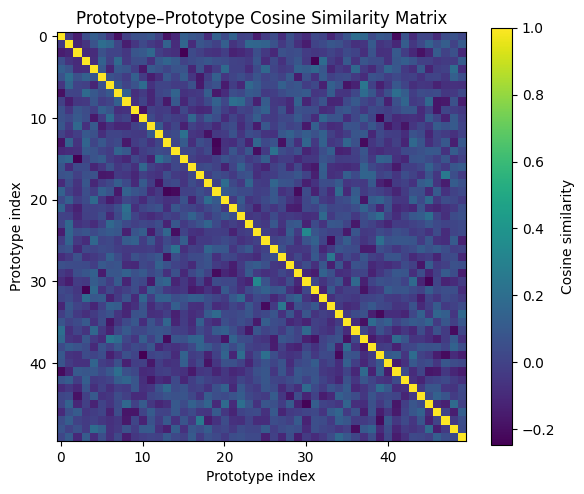

In [189]:
# Extract prototype vectors: shape (1,1,P,D) -> (P,D)
protos = proto_layer.get_weights()[0]      # (1,1,num_prototypes, prototype_dim)
P = protos.shape[2]
D = protos.shape[3]

protos_flat = protos.reshape(P, D)         # (P, D)

# L2-normalise
norms = np.linalg.norm(protos_flat, axis=1, keepdims=True) + 1e-8
protos_norm = protos_flat / norms

# Cosine similarity matrix (P x P)
cos_sim = np.matmul(protos_norm, protos_norm.T)

# Mask diagonal and compute mean off-diagonal similarity
mask = ~np.eye(P, dtype=bool)
mean_off_diag = cos_sim[mask].mean()
std_off_diag = cos_sim[mask].std()

print(f"Prototype cosine similarity (off-diagonal): mean={mean_off_diag:.3f}, std={std_off_diag:.3f}")

# Optional: visualise similarity matrix
plt.figure(figsize=(6,5))
plt.imshow(cos_sim, cmap='viridis')
plt.colorbar(label='Cosine similarity')
plt.title("Prototype–Prototype Cosine Similarity Matrix")
plt.xlabel("Prototype index")
plt.ylabel("Prototype index")
plt.tight_layout()
plt.show()

Evaluating sparsity on subset size: (200, 100, 100, 3)
⚠ Resizing from (100, 100) to (224, 224) for proto_sim_model input.
7/7 ━━━━━━━━━━━━━━━━━━━━ 10s 871ms/step
Similarity maps shape: (200, 7, 7, 50)

=== Prototype Activation Sparsity ===
Threshold (75th percentile): -9.0172
Mean active prototypes per image : 12.50
Std  active prototypes per image : 19.98


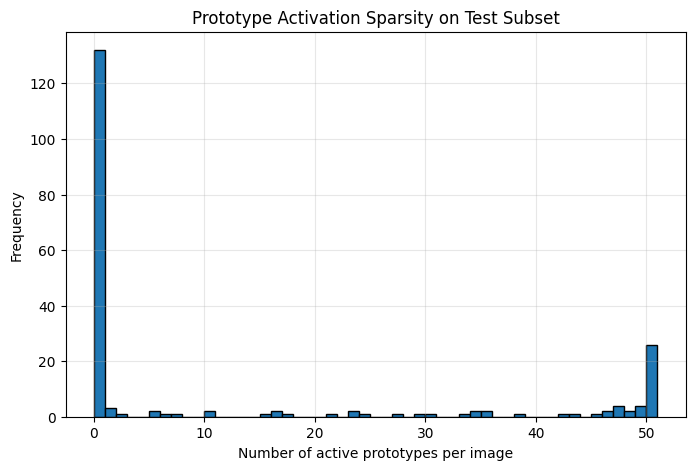

In [194]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

# Make sure this matches your model input
IMG_SIZE = (224, 224)  # height, width

# --------------------------------------------------------------
# 1. Function to compute prototype similarity maps for a dataset
# --------------------------------------------------------------
def get_proto_sim_maps(proto_sim_model, X, batch_size=32):
    """
    Computes similarity maps for all images in X.

    X: np.array shape (N, H, W, 3) – can be 100×100 or 224×224
    proto_sim_model: model that outputs ProtoLayer similarity maps

    Returns:
        sims: (N, H_feat, W_feat, P)
    """
    X_in = X.astype("float32")

    # normalise to [0,1] if needed
    if X_in.max() > 1.0:
        X_in /= 255.0

    # --- resize to model's expected input size (224×224) if needed ---
    H, W = X_in.shape[1], X_in.shape[2]
    if (H, W) != IMG_SIZE:
        print(f"⚠ Resizing from {(H, W)} to {IMG_SIZE} for proto_sim_model input.")
        X_in = tf.image.resize(X_in, IMG_SIZE).numpy()

    sims = proto_sim_model.predict(X_in, batch_size=batch_size, verbose=1)
    return sims


# --------------------------------------------------------------
# 2. Subsample test set (faster evaluation)
# --------------------------------------------------------------
N_test = X_test.shape[0]
subset_idx = np.random.choice(N_test, size=min(200, N_test), replace=False)

X_sub = X_test[subset_idx]

print("Evaluating sparsity on subset size:", X_sub.shape)


# --------------------------------------------------------------
# 3. Compute similarity maps
# --------------------------------------------------------------
sim_maps = get_proto_sim_maps(proto_sim_model, X_sub, batch_size=32)
print("Similarity maps shape:", sim_maps.shape)
# → (N_sub, H_proto, W_proto, num_prototypes)


# --------------------------------------------------------------
# 4. Global max similarity per prototype per image
# --------------------------------------------------------------
global_scores = np.max(sim_maps, axis=(1, 2))   # shape → (N_sub, P)


# --------------------------------------------------------------
# 5. Compute activation threshold & sparsity stats
# --------------------------------------------------------------
thresh = np.percentile(global_scores, 75)   # top 25% considered "active"

active_counts = (global_scores >= thresh).sum(axis=1)

print(f"\n=== Prototype Activation Sparsity ===")
print(f"Threshold (75th percentile): {thresh:.4f}")
print(f"Mean active prototypes per image : {active_counts.mean():.2f}")
print(f"Std  active prototypes per image : {active_counts.std():.2f}")


# --------------------------------------------------------------
# 6. Plot sparsity histogram
# --------------------------------------------------------------
plt.figure(figsize=(8,5))
plt.hist(active_counts, bins=range(0, active_counts.max()+2), edgecolor='black')
plt.xlabel("Number of active prototypes per image")
plt.ylabel("Frequency")
plt.title("Prototype Activation Sparsity on Test Subset")
plt.grid(alpha=0.3)
plt.show()

⚠ Resizing X_test from (100, 100) to (224, 224) for proto_model input.
=== Classification Report (Macro & Per-Class) ===
              precision    recall  f1-score   support

        Mild     0.1751    0.1594    0.1669       389
    Moderate     0.2053    0.2500    0.2255       400
       No_dr     0.1890    0.2090    0.1985       378
 Prolifirate     0.2236    0.1648    0.1897       449
      Severe     0.1683    0.1797    0.1738       384

    accuracy                         0.1920      2000
   macro avg     0.1923    0.1926    0.1909      2000
weighted avg     0.1934    0.1920    0.1910      2000



<Figure size 600x600 with 0 Axes>

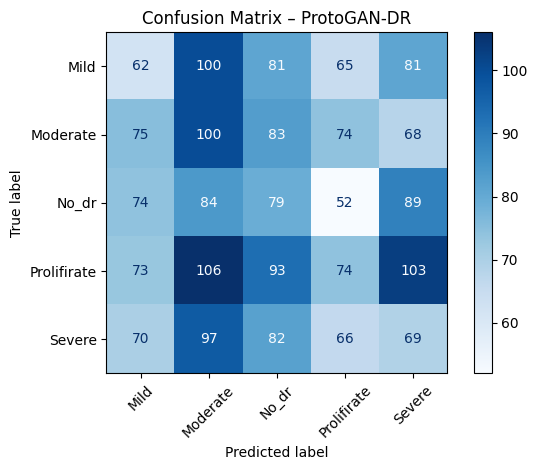

✅ Cohen's Kappa (agreement beyond chance): -0.0089


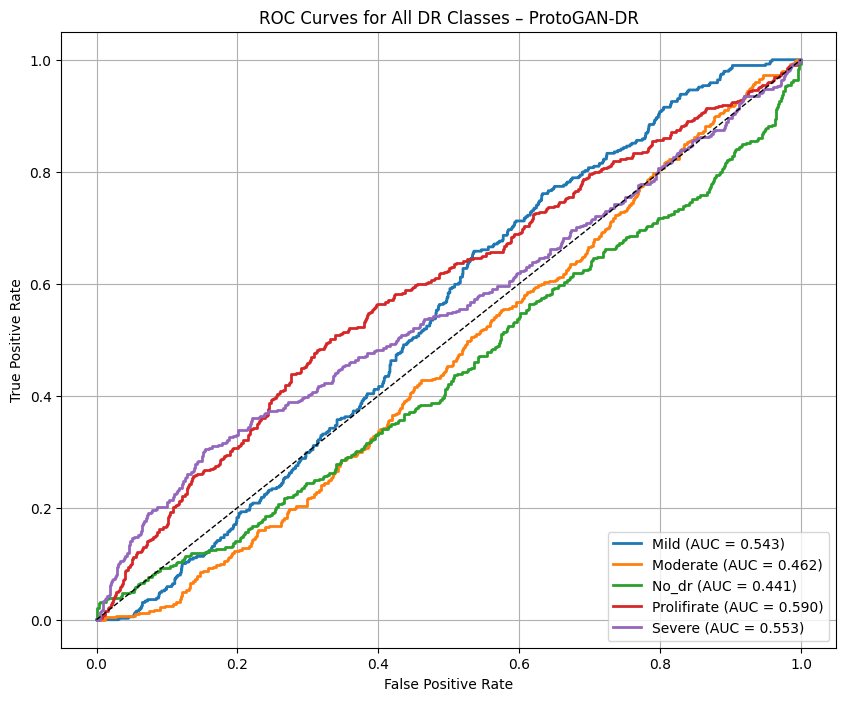

Detected minority indices: [4]


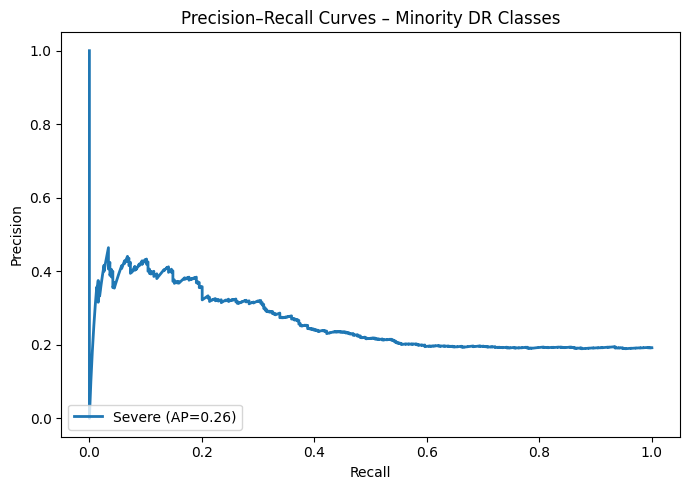


Brier Score (probability calibration, lower is better): 0.7779
Interpretation: lower Brier score = better calibrated confidence.


In [195]:
# ============================================
# Classification Evaluation – Rich Metrics
# (Compatible with 224×224 proto_model)
# ============================================
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    roc_curve,
    roc_auc_score,
    precision_recall_curve,
    average_precision_score,
    cohen_kappa_score,
    ConfusionMatrixDisplay,
    auc,
    brier_score_loss
)
import tensorflow as tf

# Ensure this matches your proto_model input size
IMG_SIZE = (224, 224)   # (height, width)

# --------------------------------------------
# 0. Prepare X_test for proto_model (224×224)
# --------------------------------------------
X_test_in = X_test.astype("float32")

# normalise to [0,1] if needed
if X_test_in.max() > 1.0:
    X_test_in /= 255.0

# resize to 224×224 if needed
H, W = X_test_in.shape[1], X_test_in.shape[2]
if (H, W) != IMG_SIZE:
    print(f"⚠ Resizing X_test from {(H, W)} to {IMG_SIZE} for proto_model input.")
    X_test_in = tf.image.resize(X_test_in, IMG_SIZE).numpy()

# --------------------------------------------
# 1. Basic metrics & confusion matrix
# --------------------------------------------
num_classes = len(class_names)

print("=== Classification Report (Macro & Per-Class) ===")
print(classification_report(y_test, y_pred, target_names=class_names, digits=4))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
plt.figure(figsize=(6, 6))
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix – ProtoGAN-DR")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Cohen's Kappa
kappa = cohen_kappa_score(y_test, y_pred)
print(f"✅ Cohen's Kappa (agreement beyond chance): {kappa:.4f}")

# --------------------------------------------
# 2. ROC & AUC (one-vs-rest)
# --------------------------------------------
# One-hot encode y_test
y_test_oh = tf.keras.utils.to_categorical(y_test, num_classes)

# 🔁 Predicted probabilities from prototype model on 224×224 input
y_pred_proba = proto_model.predict(X_test_in, verbose=0)

fpr = {}
tpr = {}
roc_auc = {}

for c in range(num_classes):
    fpr[c], tpr[c], _ = roc_curve(y_test_oh[:, c], y_pred_proba[:, c])
    roc_auc[c] = auc(fpr[c], tpr[c])

# Plot ROC Curves
plt.figure(figsize=(10, 8))

for c in range(num_classes):
    plt.plot(fpr[c], tpr[c], lw=2,
             label=f'{class_names[c]} (AUC = {roc_auc[c]:.3f})')

plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for All DR Classes – ProtoGAN-DR')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# --------------------------------------------
# 3. Precision–Recall for minority classes
#    (Severe & Proliferate_DR or similar)
# --------------------------------------------
minority_labels = ["Severe", "Proliferate"]  # substrings

minority_indices = [
    i for i, name in enumerate(class_names)
    if any(lbl.lower() in name.lower() for lbl in minority_labels)
]

print("Detected minority indices:", minority_indices)

plt.figure(figsize=(7, 5))
for idx, c in enumerate(minority_indices):
    precision, recall, _ = precision_recall_curve(y_test_oh[:, c], y_pred_proba[:, c])
    ap = average_precision_score(y_test_oh[:, c], y_pred_proba[:, c])
    plt.plot(recall, precision, lw=2,
             label=f"{class_names[c]} (AP={ap:.2f})")

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision–Recall Curves – Minority DR Classes")
plt.legend(loc="lower left")
plt.tight_layout()
plt.show()

# --------------------------------------------
# 4. Calibration – Brier score (overall)
# --------------------------------------------
# Use the predicted probability of the predicted class for each sample
y_pred_labels = np.argmax(y_pred_proba, axis=1)
p_hat = np.max(y_pred_proba, axis=1)           # confidence of chosen class
y_true_binary = (y_pred_labels == y_test).astype(int)  # 1 = correct, 0 = wrong

brier = brier_score_loss(y_true_binary, p_hat)
print(f"\nBrier Score (probability calibration, lower is better): {brier:.4f}")
print("Interpretation: lower Brier score = better calibrated confidence.")